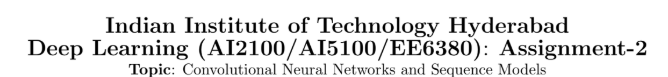


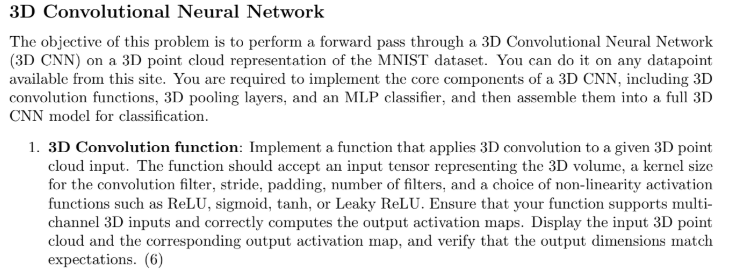
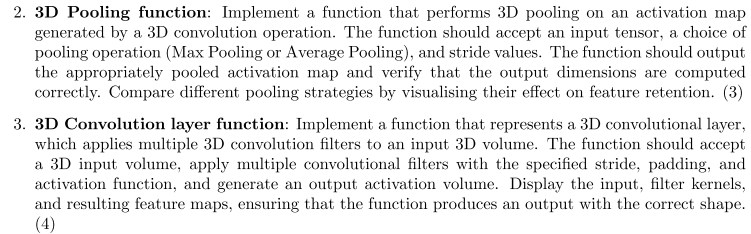
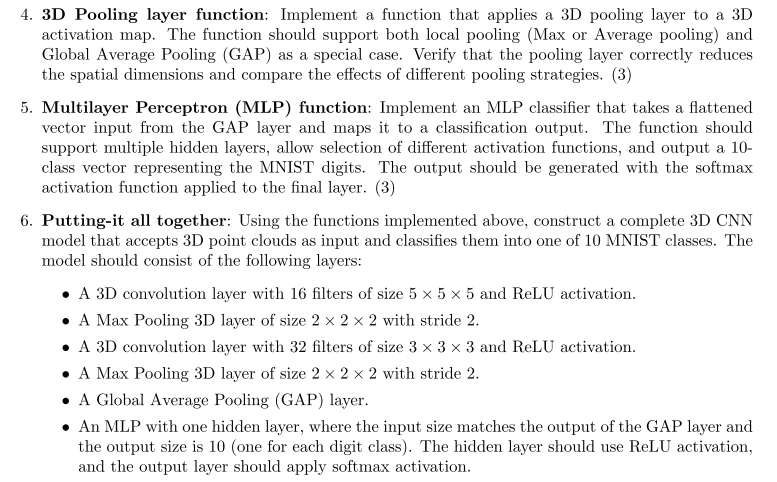


In [ ]:
import numpy as np 
import matplotlib.pyplot as plt
import torch
# print(torch.cuda.is_available())

# Convolutional Neural Network


### Reading Data


In [3]:
import h5py

# Load dataset
with h5py.File("full_dataset_vectors.h5", "r") as dataset:
    X_train = torch.tensor(dataset["X_train"][:100], dtype=torch.float32)  # Convert and slice
    X_test = torch.tensor(dataset["X_test"][:20], dtype=torch.float32)
    Y_train = torch.tensor(dataset["y_train"][:100], dtype=torch.long)  # Ensure labels are integers
    Y_test = torch.tensor(dataset["y_test"][:20], dtype=torch.long)

# Print shapes to verify
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("Y_train shape:", Y_train.shape)
print("Y_test shape:", Y_test.shape)

X_train shape: torch.Size([100, 4096])
X_test shape: torch.Size([20, 4096])
Y_train shape: torch.Size([100])
Y_test shape: torch.Size([20])


In [9]:
x1 = X_train[0].reshape((1,16,16,16)) # 1 channel 
x1.shape,Y_train[0]

(torch.Size([1, 16, 16, 16]), tensor(5))

### 1) 3D Convolutional Function


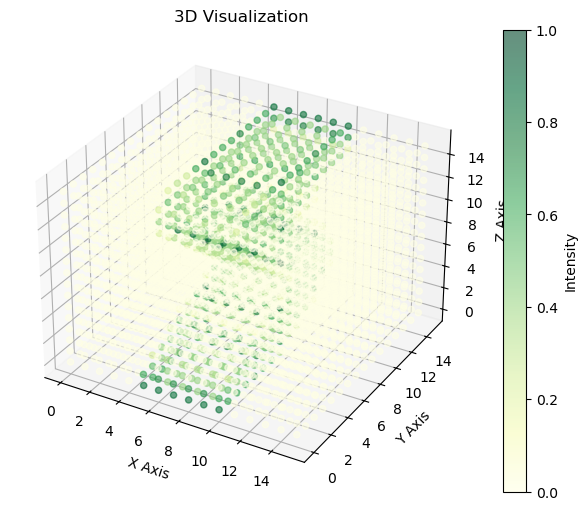

In [ ]:
# 3D Convolutional neural network
def Activation(fnx,x):
    if fnx == "ReLU":
        return np.maximum(0, x) 
    elif fnx == "tanh":
        return np.tanh(x) 
    elif fnx == "sigmoid":
        return 1 / (1 + np.exp(-x))  
    elif fnx == "leakyRelu":
        return np.where(x > 0, x, 0.001 * x)

# 3D Convolution Function
def Conv3D(input_tensor, kernel_size, stride, padding, activation_fn):
    
    if not isinstance(input_tensor, torch.Tensor):
        input_tensor = torch.tensor(input_tensor, dtype=torch.float32)
        
    N, Nx, Ny, Nz = input_tensor.shape  # Input tensor shape (channels, depth, height, width)
    Nkx, Nky, Nkz = kernel_size  # Kernel size (depth, height, width)
    p = padding 
    s = stride  
    # print("Input Size:",input_tensor.shape)
    # print("Kernels Size:",kernel_size)

    # #Displaying 3D data Input Data Cloud
    # print("3D data cloud: \n")
    # visualize_3D_input_meshgrid(input_tensor[0])

    pad_input = torch.zeros((N, Nx + 2 * p, Ny + 2 * p, Nz + 2 * p), dtype=torch.float32)
    pad_input[:, p:Nx + p, p:Ny + p, p:Nz + p] = input_tensor


    out_depth = (Nx + 2 * p - Nkx) // s + 1
    out_height = (Ny + 2 * p - Nky) // s + 1
    out_width = (Nz + 2 * p - Nkz) // s + 1

    # print(out_depth,out_height,out_width)
    activation_map = torch.zeros((out_depth, out_height, out_width), dtype=torch.float32)

    output_channels = N  # Assuming output channels = input channels
    kernels = torch.rand((N, Nkx, Nky, Nkz), dtype=torch.float32)

    for i in range(out_depth):
        for j in range(out_height):
            for k in range(out_width):
                input_slice = pad_input[:, i * s:i * s + Nkx, j * s:j * s + Nky, k * s:k * s + Nkz]

                # Apply the kernel to the input slice
                # print(f"Input slice shape: {input_slice.shape}, Kernels shape: {kernels.shape}")

                zi = torch.sum(input_slice * kernels[0])
                activation_map[i, j, k] = zi


    if activation_fn:
        activation_map = Activation(activation_fn, activation_map)

    print(f"Activation map shape: {activation_map.shape}")
    visualize_3D_input_meshgrid(activation_map)
    
    return activation_map

# 3D Visualization Function
def visualize_3D_input_meshgrid(data, title='3D Visualization'):
    """Visualize a 3D tensor using a scatter plot with meshgrid."""
    # Convert PyTorch tensor to numpy array if needed
    if isinstance(data, torch.Tensor):
        data = data.detach().cpu().numpy()
        
    z, y, x = np.meshgrid(np.arange(data.shape[0]),
                          np.arange(data.shape[1]),
                          np.arange(data.shape[2]),
                          indexing='ij')
    
    x = x.flatten()
    y = y.flatten()
    z = z.flatten()
    values = data.flatten()  #  same number of elements as x, y, z

    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')
    
    # Check if all arrays have the same length
    assert len(x) == len(y) == len(z) == len(values), \
        f"Shape mismatch: x={len(x)}, y={len(y)}, z={len(z)}, values={len(values)}"
    
    sc = ax.scatter(x, y, z, c=values, cmap="YlGn", alpha=0.6)
    plt.colorbar(sc, label='Intensity')
    ax.set_title(title)
    ax.set_xlabel('X Axis')
    ax.set_ylabel('Y Axis')
    ax.set_zlabel('Z Axis')
    plt.show()

visualize_3D_input_meshgrid(x1[0])

Activation map shape: torch.Size([8, 8, 8])


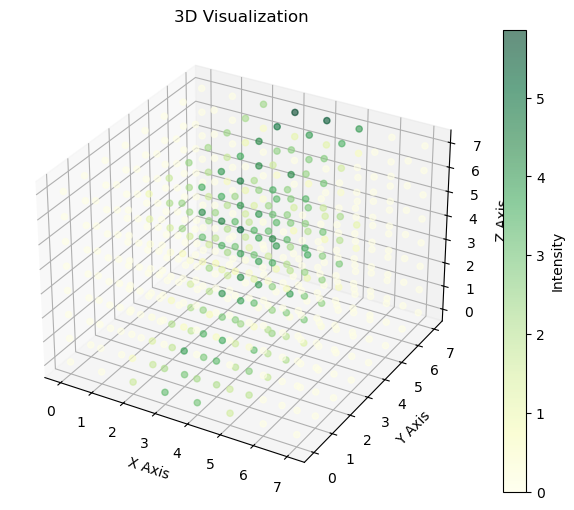

In [13]:
activation_map = Conv3D(x1, 
                        kernel_size=(3, 3, 3), 
                        stride=2, 
                        padding=1,
                        activation_fn="ReLU")

### 2) Pooling Fnx


In [ ]:
# 3D Pooling Function 
def Pool3D(activation_tensor, pool_size=(2, 2, 2), stride=2, pooling_type="max"):
    """
    Applies 3D pooling to the input tensor using either max or average pooling.
    
    Parameters:
    - input_tensor (torch.Tensor): Input tensor of shape (channels, depth, height, width).
    - pool_size (tuple): Size of the pooling window (depth, height, width).
    - stride (int): Stride size for pooling.
    - pooling_type (str): Pooling method ('max' or 'average').
    
    Returns:
    - pooled_tensor (torch.Tensor): Pooled output tensor.
    """

    if not isinstance(activation_tensor, torch.Tensor):
        activation_tensor = torch.tensor(activation_tensor, dtype=torch.float32)
    
    Nx, Ny, Nz = activation_tensor.shape
    px, py, pz = pool_size  
    s = stride  

    out_D = (Nx - px) // s + 1
    out_H = (Ny - py) // s + 1
    out_W = (Nz - pz) // s + 1

    pooled_tensor = torch.zeros(( out_D, out_H, out_W), dtype=torch.float32)

    # Perform 3D pooling operation
    for i in range(out_D):
        for j in range(out_H):
            for k in range(out_W):
        
                d_start, h_start, w_start = i * s, j * s, k * s
                d_end, h_end, w_end = d_start + px, h_start + py, w_start + pz
             
                pool_region = activation_tensor[d_start:d_end, h_start:h_end, w_start:w_end]
                
                if pooling_type == "max":
                    pooled_tensor[i, j, k] = torch.max(pool_region)
                elif pooling_type == "average":
                    pooled_tensor[i, j, k] = torch.mean(pool_region)
                else:
                    raise ValueError("Pooling type must be 'max' or 'average'")

    print(f"Pooled output shape: {pooled_tensor.shape}")
    return pooled_tensor

In [ ]:
pooled_tensor = Pool3D(activation_map, pool_size=(2, 2, 2), stride=2, pooling_type="max")

Pooled output shape: torch.Size([4, 4, 4])


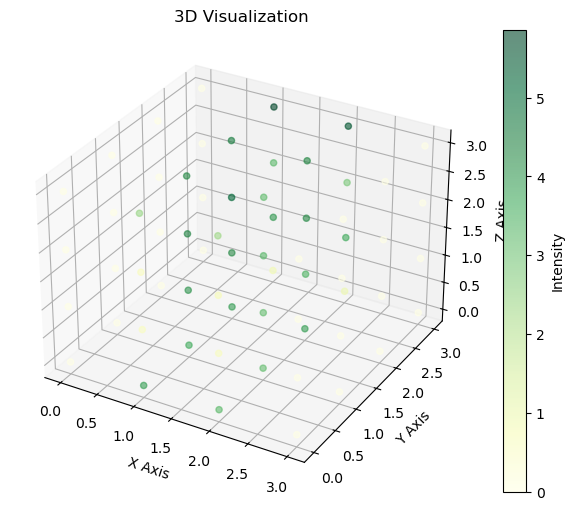

In [ ]:
visualize_3D_input_meshgrid(pooled_tensor)

### 3) 3D Conv Layer Fnx


In [ ]:
import torch

# Function to apply multiple 3D convolutions and generate multiple activation maps
def Conv3DLayer(input_tensor, num_filters, kernel_size, stride, padding, activation_fn):
    """
    Applies a 3D convolutional layer using multiple filters to generate an activation volume.
    
    Parameters:
    - input_tensor (torch.Tensor): Input tensor of shape (channels, depth, height, width).
    - num_filters (int): Number of filters to apply.
    - kernel_size (tuple): Size of the 3D convolution kernel (depth, height, width).
    - stride (int): Stride size for the convolution.
    - padding (int): Padding size for the input tensor.
    - activation_fn (str): Activation function to apply ('ReLU', 'sigmoid', etc.).
    
    Returns:
    - output_tensor (torch.Tensor): The tensor containing the stacked activation maps.
    """

    if not isinstance(input_tensor, torch.Tensor):
        input_tensor = torch.tensor(input_tensor, dtype=torch.float32)
        
    N, Nx, Ny, Nz = input_tensor.shape
    
    out_depth = (Nx + 2 * padding - kernel_size[0]) // stride + 1
    out_height = (Ny + 2 * padding - kernel_size[1]) // stride + 1
    out_width = (Nz + 2 * padding - kernel_size[2]) // stride + 1

    output_tensor = torch.zeros((num_filters, out_depth, out_height, out_width), dtype=torch.float32)
    
    print(f"Input shape: {input_tensor.shape}")
    print(f"Number of Filters: {num_filters}")
    print(f"Kernel Size: {kernel_size}")
    print(f"Activation Map Shape: {output_tensor.shape}")

    # Apply multiple 3D convolution filters
    for f in range(num_filters):
        print(f"\nApplying Filter {f + 1}/{num_filters}:")
        
        # Generate a random kernel for each filter
        activation_map = Conv3D(input_tensor, 
                                kernel_size=kernel_size, 
                                stride=stride, 
                                padding=padding, 
                                activation_fn=activation_fn)
        
        # Store the activation map in the output tensor
        output_tensor[f] = activation_map

    print(f"Output Tensor Shape (Activation Volume): {output_tensor.shape}")
    
    return output_tensor

Input shape: torch.Size([1, 16, 16, 16])
Number of Filters: 4
Kernel Size: (3, 3, 3)
Activation Map Shape: torch.Size([4, 16, 16, 16])

Applying Filter 1/4:
Activation map shape: torch.Size([16, 16, 16])


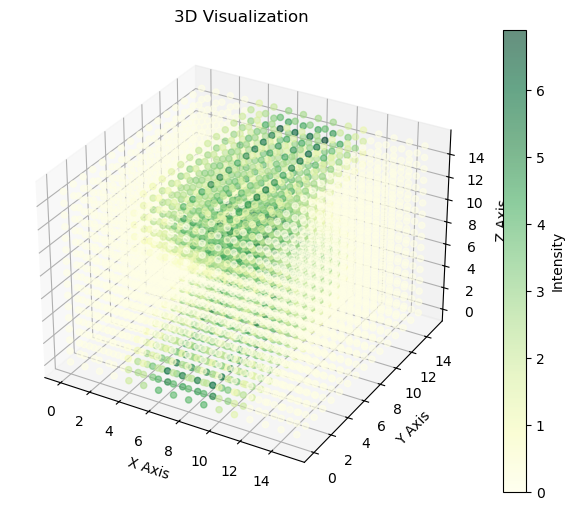


Applying Filter 2/4:
Activation map shape: torch.Size([16, 16, 16])


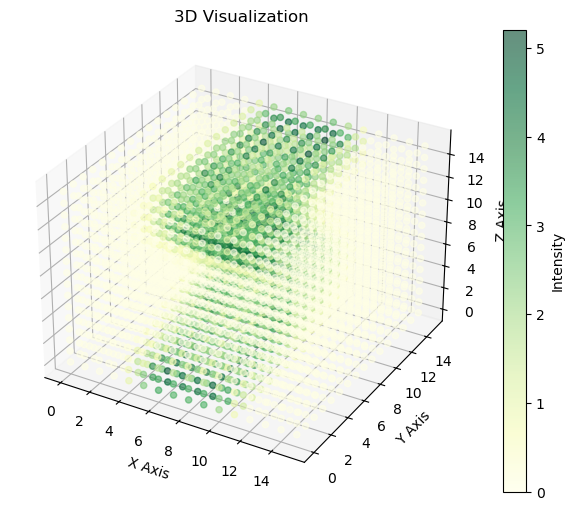


Applying Filter 3/4:
Activation map shape: torch.Size([16, 16, 16])


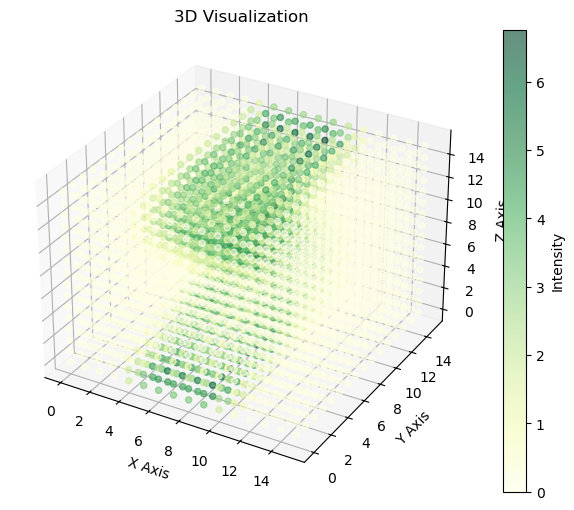


Applying Filter 4/4:
Activation map shape: torch.Size([16, 16, 16])


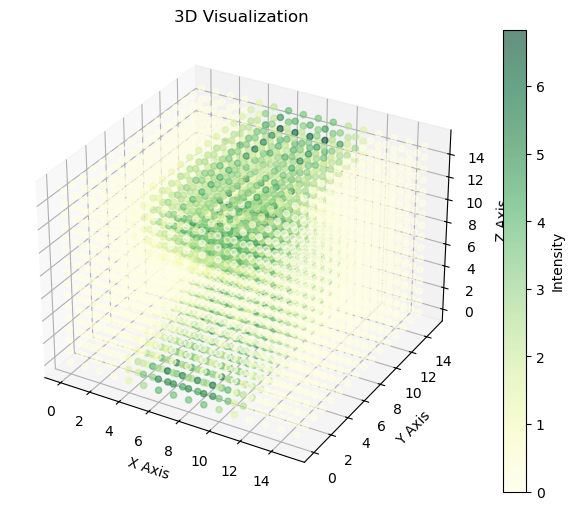

Output Tensor Shape (Activation Volume): torch.Size([4, 16, 16, 16])


In [26]:
# Applying a 3D Convolutional Layer with 4 filters, kernel size 3x3x3, stride 1, and padding 1
activations_maps = Conv3DLayer(x1, 
                            num_filters=4, 
                            kernel_size=(3, 3, 3), 
                            stride=1, 
                            padding=1, 
                            activation_fn="ReLU")

### 4) 3D Pooling Layer Funtion


In [ ]:
def Pool3DLayer(input_tensor, pool_size=(2, 2, 2), stride=2, pooling_type="max", GAP=False):
    """
    Applies a 3D pooling layer to a 3D activation map.
    
    Parameters:
    - input_tensor (torch.Tensor): Input tensor of shape (num_filters, depth, height, width).
    - pool_size (tuple): Size of the 3D pooling window (depth, height, width).
    - stride (int): Stride size for pooling.
    - pooling_type (str): Type of pooling ('max' or 'average').
    - global_pooling (bool): If True, applies Global Average Pooling (GAP).
    
    Returns:
    - pooled_tensor (torch.Tensor): The tensor after pooling with reduced dimensions.
    - If GAP=True: 1D tensor
    """
    num_filters, Nx, Ny, Nz = input_tensor.shape  # Channels, Depth, Height, Width

    if GAP:        
        pooled_tensor = torch.mean(input_tensor, dim=(1, 2, 3), keepdim=True)
        print(f"Global Average Pooled Shape: {pooled_tensor.shape}")
        return torch.squeeze(pooled_tensor)

    #dimensions of the output tensor for local pooling
    out_D = (Nx - pool_size[0]) // stride + 1
    out_H = (Ny - pool_size[1]) // stride + 1
    out_W = (Nz - pool_size[2]) // stride + 1

    # Initialize the pooled output tensor
    pooled_tensor = torch.zeros((num_filters, out_D, out_H, out_W), dtype=torch.float32)

    # Perform 3D pooling operation
    for f in range(num_filters):  # Iterate over filters
        for i in range(out_D):
            for j in range(out_H):
                for k in range(out_W):
                    d_start, h_start, w_start = i * stride, j * stride, k * stride
                    d_end, h_end, w_end = d_start + pool_size[0], h_start + pool_size[1], w_start + pool_size[2]

                    pool_region = input_tensor[f, d_start:d_end, h_start:h_end, w_start:w_end]

                    if pooling_type == "max":
                        pooled_tensor[f, i, j, k] = torch.max(pool_region)
                    elif pooling_type == "average":
                        pooled_tensor[f, i, j, k] = torch.mean(pool_region)
                    else:
                        raise ValueError("Pooling type must be 'max' or 'average'")

    print(f"Pooled Output Shape: {pooled_tensor.shape}")
    return pooled_tensor

In [ ]:
Pool3DLayer(activations_maps,GAP=True) #(n,)

### 5) MLP Classifier


In [ ]:
import torch
import torch.nn.functional as F

# Define a vanilla MLP classifier without nn.Module
class MLPClassifier:
    def __init__(self, input_size, hidden_layers=[128, 64], activation_fn="ReLU", num_classes=10, learning_rate=0.01):
        """
        Multilayer Perceptron (MLP) Classifier from scratch for 10-class classification.
        
        Parameters:
        - input_size (int): The size of the input vector (e.g., from the GAP layer).
        - hidden_layers (list): List of neuron counts for each hidden layer.
        - activation_fn (str): Activation function ('ReLU', 'Sigmoid', 'Tanh').
        - num_classes (int): Number of output classes (default is 10 for MNIST).
        - learning_rate (float): Learning rate for manual gradient descent.
        """
        self.lr = learning_rate
        
        self.layers = []
        self.biases = []
        prev_size = input_size
        
        for hidden_size in hidden_layers:
            self.layers.append(torch.randn(prev_size, hidden_size) * 0.01)  # Initialize weights
            self.biases.append(torch.zeros(hidden_size))
            prev_size = hidden_size
        
        self.layers.append(torch.randn(prev_size, num_classes) * 0.01)
        self.biases.append(torch.zeros(num_classes))
        
        # Store as tensors with gradients enabled
        self.layers = [torch.tensor(w, dtype=torch.float32, requires_grad=True) for w in self.layers]
        self.biases = [torch.tensor(b, dtype=torch.float32, requires_grad=True) for b in self.biases]
        
        if activation_fn not in ["ReLU", "Sigmoid", "Tanh"]:
            raise ValueError("Invalid activation function. Choose from 'ReLU', 'Sigmoid', 'Tanh'.")
        self.activation_fn = activation_fn

    def activation(self, x):
        """Apply the chosen activation function."""
        if self.activation_fn == "ReLU":
            return torch.maximum(x, torch.tensor(0.0))
        elif self.activation_fn == "Sigmoid":
            return 1 / (1 + torch.exp(-x))
        elif self.activation_fn == "Tanh":
            return torch.tanh(x)

    def softmax(self, x):
        """Compute softmax activation for the output layer."""
        exp_x = torch.exp(x - torch.max(x, dim=1, keepdim=True)[0])  
        return exp_x / torch.sum(exp_x, dim=1, keepdim=True)

    def forward(self, x):
        """Perform a forward pass through the network."""
        for i in range(len(self.layers) - 1):
            x = x @ self.layers[i] + self.biases[i]
            x = self.activation(x)
        
        # Output layer with softmax
        x = x @ self.layers[-1] + self.biases[-1]
        return self.softmax(x)

    def compute_loss(self, predictions, targets):
        """Compute cross-entropy loss."""
        num_samples = predictions.shape[0]
        
        # Clip predictions for numerical stability :- like log(0)
        predictions = torch.clip(predictions, 1e-7, 1.0)
        # Cross-entropy loss
        loss = -torch.sum(targets * torch.log(predictions)) / num_samples
        return loss

    def backward(self, x, predictions, targets):
        """Manual backpropagation to compute gradients and update weights."""
        num_samples = x.shape[0]
        
        # Calculate gradient of the loss with respect to output (softmax + cross-entropy)
        grad_output = predictions - targets  # (batch_size, num_classes)
        for i in reversed(range(len(self.layers))):
            # Gradient for weights and biases
            grad_weights = (x.T @ grad_output) / num_samples
            grad_biases = torch.sum(grad_output, dim=0) / num_samples
            
            # Update weights and biases using gradient descent
            self.layers[i] -= self.learning_rate * grad_weights
            self.biases[i] -= self.learning_rate * grad_biases
            
            # Backpropagate to the previous layer if not input layer
            if i > 0:
                x = x @ self.layers[i - 1] + self.biases[i - 1]
                if self.activation_fn == "ReLU":
                    grad_activation = (x > 0).float()
                elif self.activation_fn == "Sigmoid":
                    grad_activation = x * (1 - x)
                elif self.activation_fn == "Tanh":
                    grad_activation = 1 - x ** 2
                
                grad_output = grad_output @ self.layers[i].T * grad_activation

    def train(self, x, y, epochs=100):
        """Training loop for the MLP."""
        for epoch in range(epochs):
            predictions = self.forward(x)
            loss = self.compute_loss(predictions, y)
            
            if epoch % 10 == 0:
                print(f"Epoch {epoch}: Loss = {loss.item():.4f}")
            
            self.backward(x, predictions, y)

### 6) Complete CNN


In [ ]:
# Complete 3D CNN Model
class CNN3DModel:
    def __init__(self, num_classes=10, learning_rate=0.01):
        self.num_classes = num_classes
        self.lr = learning_rate
        self.gap_output_size = 32
        
    
        self.mlp = MLPClassifier(input_size=self.gap_output_size, hidden_layers=[64], activation_fn="ReLU", num_classes=num_classes, learning_rate=learning_rate)

    def forward(self, x):
        # 1st 3D Convolution + ReLU
        x = Conv3DLayer(x, num_filters=16, kernel_size=(5, 5, 5), stride=1, padding=0, activation_fn="ReLU")
        
        # 1st Max Pooling
        x = Pool3DLayer(x, pool_size=(2, 2, 2), stride=2, pooling_type="max")
        
        # 2nd 3D Convolution + ReLU
        x = Conv3DLayer(x, num_filters=32, kernel_size=(3, 3, 3), stride=1, padding=0, activation_fn="ReLU")
        
        # 2nd Max Pooling
        x = Pool3DLayer(x, pool_size=(2, 2, 2), stride=2, pooling_type="max")
        
        # Global Average Pooling
        x = Pool3DLayer(x, GAP=True)
        
        # MLP Classifier
        x = self.mlp.forward(x.unsqueeze(0))
        return x

C:\Users\abhin\AppData\Local\Temp\ipykernel_7268\870280249.py:35: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.layers = [torch.tensor(w, dtype=torch.float32, requires_grad=True) for w in self.layers]
C:\Users\abhin\AppData\Local\Temp\ipykernel_7268\870280249.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.biases = [torch.tensor(b, dtype=torch.float32, requires_grad=True) for b in self.biases]


Input shape: torch.Size([1, 16, 16, 16])
Number of Filters: 16
Kernel Size: (5, 5, 5)
Activation Map Shape: torch.Size([16, 12, 12, 12])

Applying Filter 1/16:
Activation map shape: torch.Size([12, 12, 12])


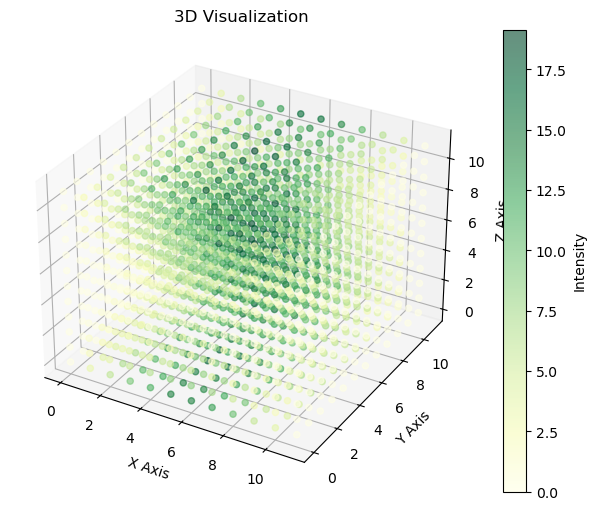


Applying Filter 2/16:
Activation map shape: torch.Size([12, 12, 12])


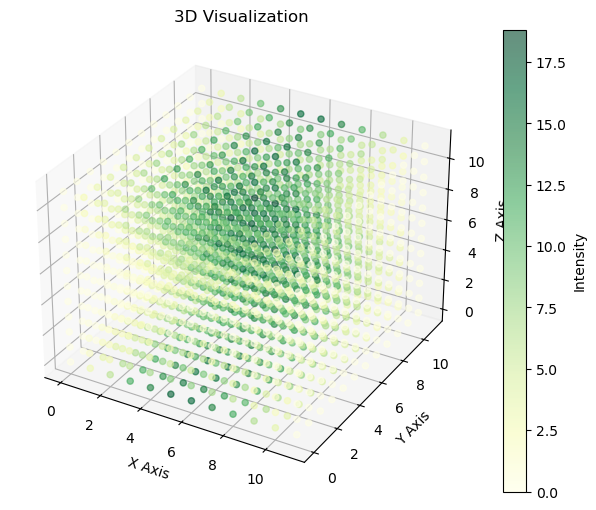


Applying Filter 3/16:
Activation map shape: torch.Size([12, 12, 12])


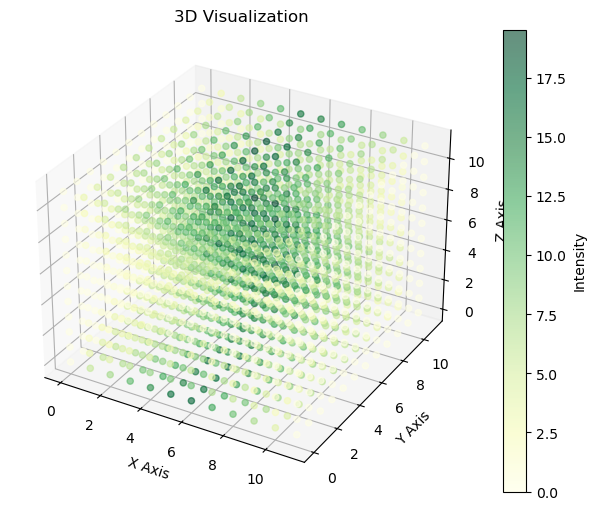


Applying Filter 4/16:
Activation map shape: torch.Size([12, 12, 12])


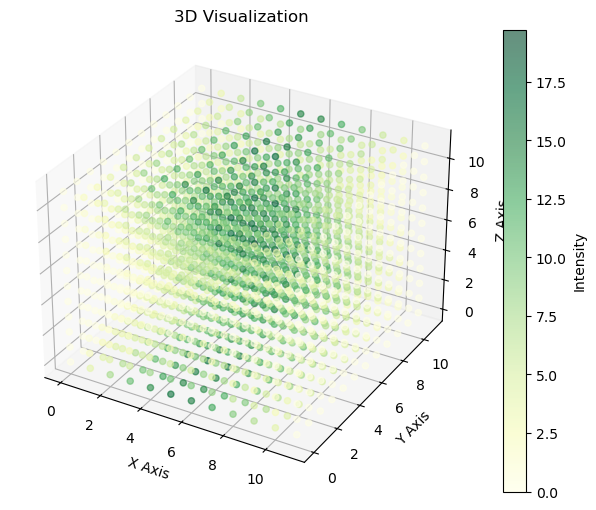


Applying Filter 5/16:
Activation map shape: torch.Size([12, 12, 12])


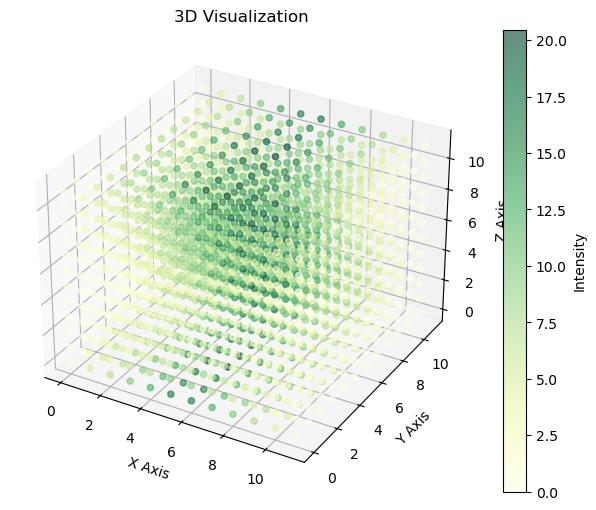


Applying Filter 6/16:
Activation map shape: torch.Size([12, 12, 12])


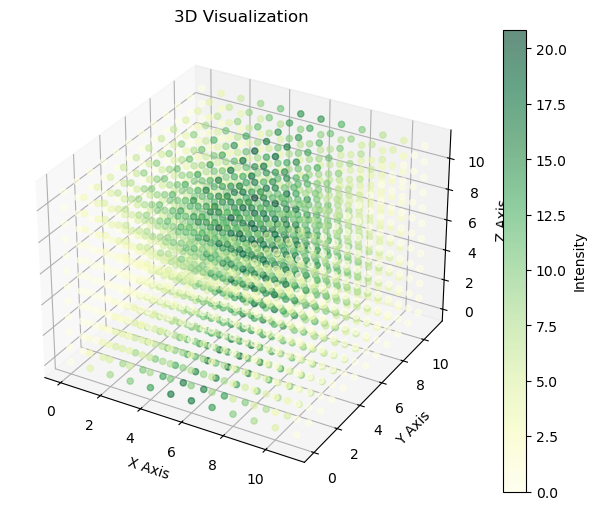


Applying Filter 7/16:
Activation map shape: torch.Size([12, 12, 12])


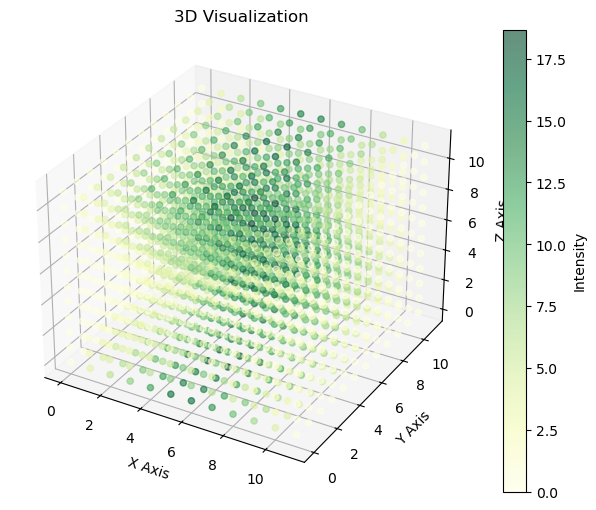


Applying Filter 8/16:
Activation map shape: torch.Size([12, 12, 12])


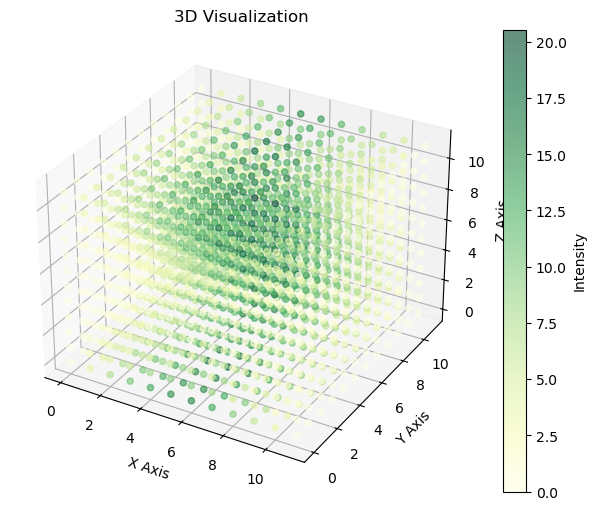


Applying Filter 9/16:
Activation map shape: torch.Size([12, 12, 12])


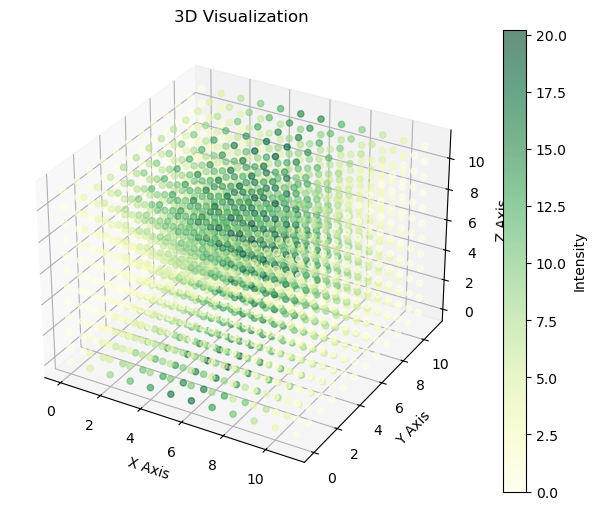


Applying Filter 10/16:
Activation map shape: torch.Size([12, 12, 12])


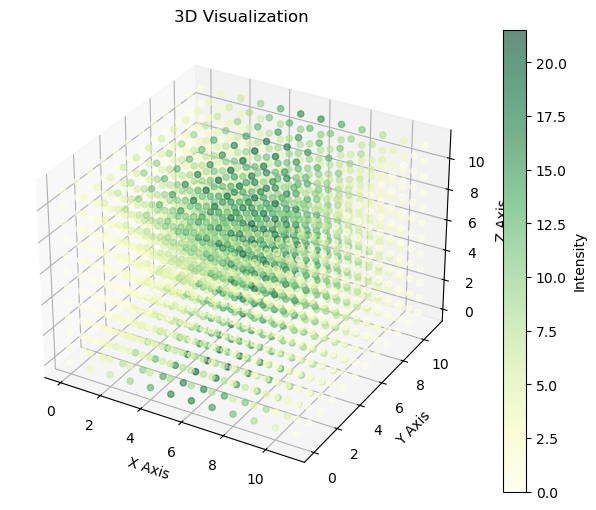


Applying Filter 11/16:
Activation map shape: torch.Size([12, 12, 12])


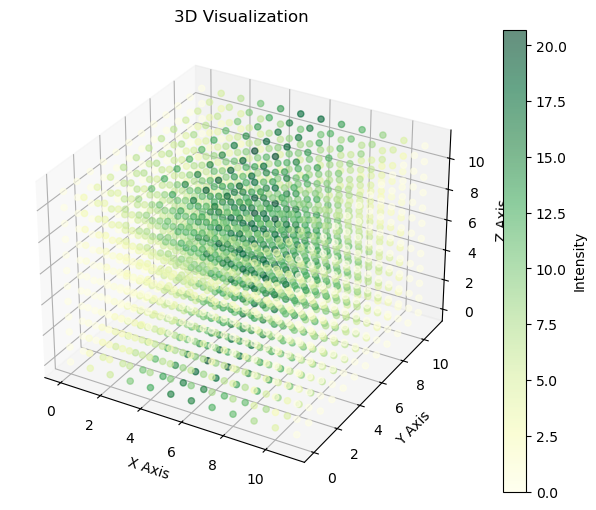


Applying Filter 12/16:
Activation map shape: torch.Size([12, 12, 12])


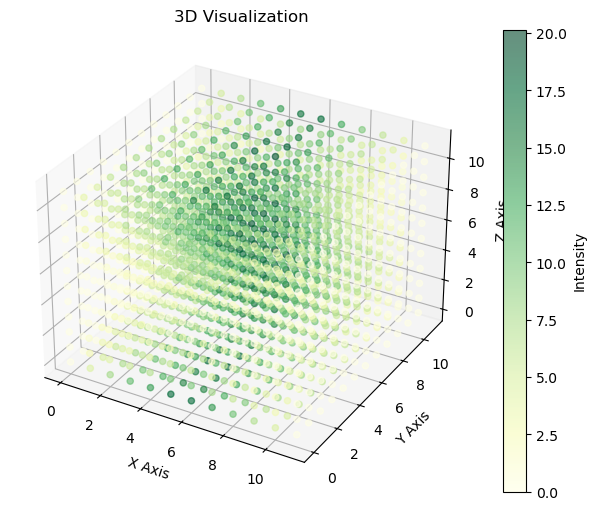


Applying Filter 13/16:
Activation map shape: torch.Size([12, 12, 12])


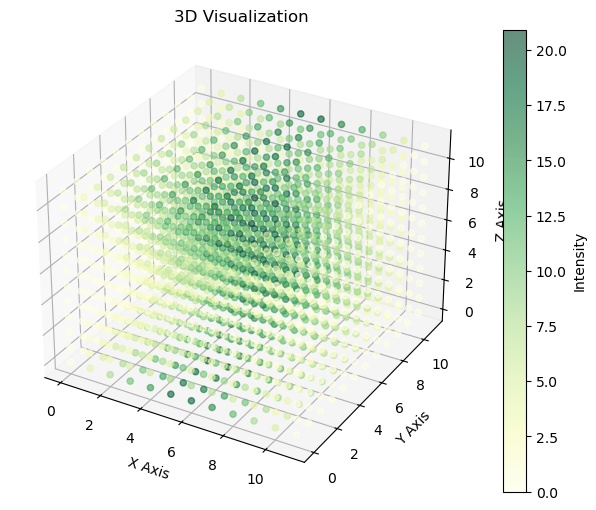


Applying Filter 14/16:
Activation map shape: torch.Size([12, 12, 12])


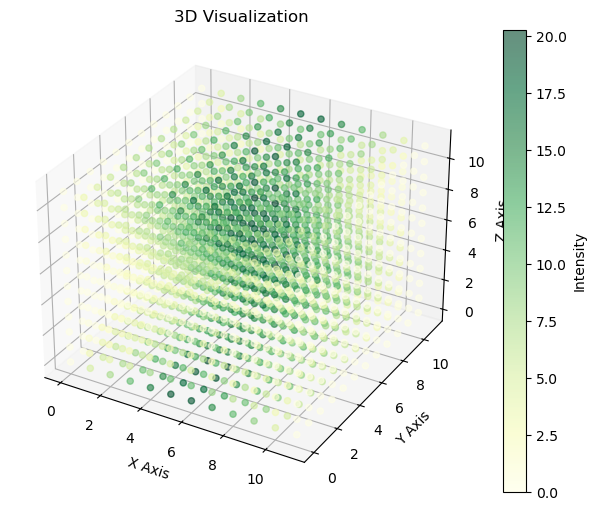


Applying Filter 15/16:
Activation map shape: torch.Size([12, 12, 12])


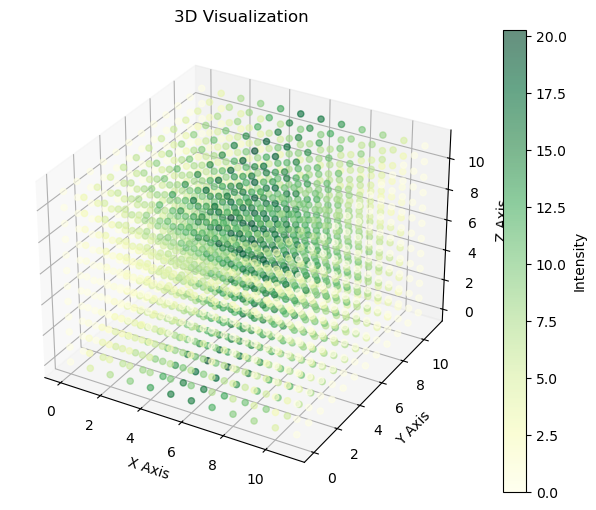


Applying Filter 16/16:
Activation map shape: torch.Size([12, 12, 12])


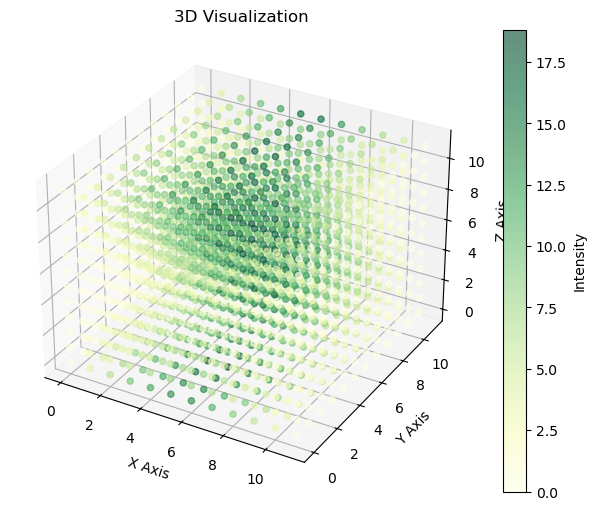

Output Tensor Shape (Activation Volume): torch.Size([16, 12, 12, 12])
Pooled Output Shape: torch.Size([16, 6, 6, 6])
Input shape: torch.Size([16, 6, 6, 6])
Number of Filters: 32
Kernel Size: (3, 3, 3)
Activation Map Shape: torch.Size([32, 4, 4, 4])

Applying Filter 1/32:
Activation map shape: torch.Size([4, 4, 4])


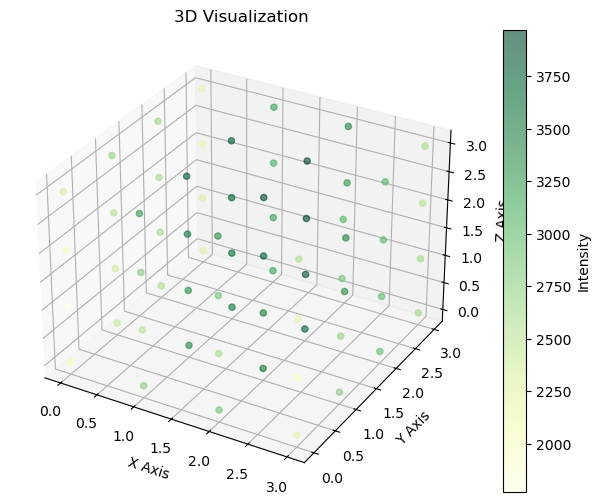


Applying Filter 2/32:
Activation map shape: torch.Size([4, 4, 4])


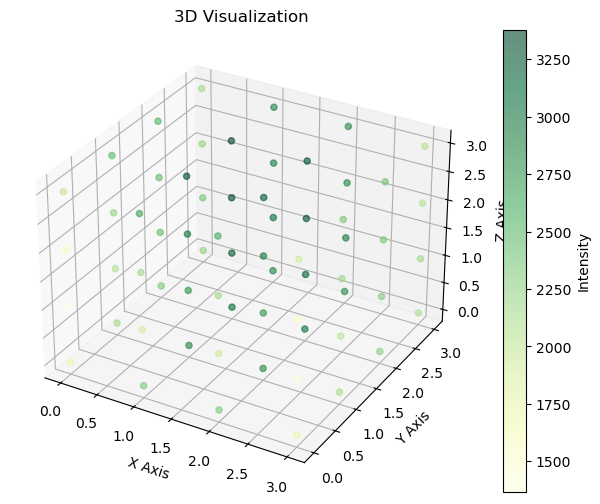


Applying Filter 3/32:
Activation map shape: torch.Size([4, 4, 4])


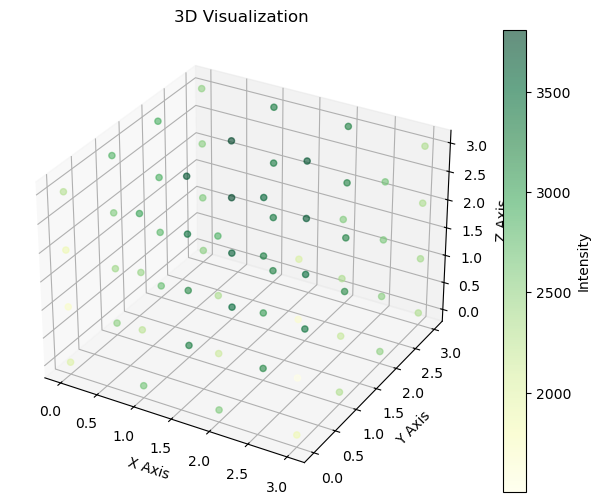


Applying Filter 4/32:
Activation map shape: torch.Size([4, 4, 4])


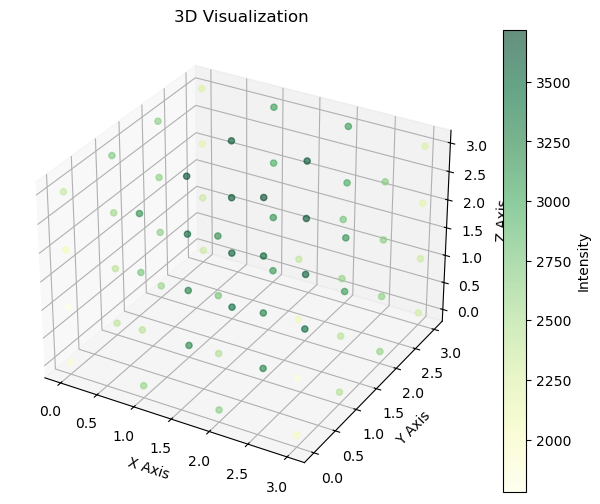


Applying Filter 5/32:
Activation map shape: torch.Size([4, 4, 4])


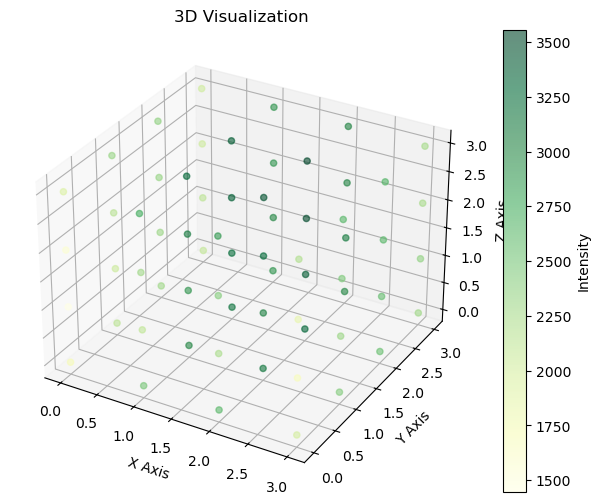


Applying Filter 6/32:
Activation map shape: torch.Size([4, 4, 4])


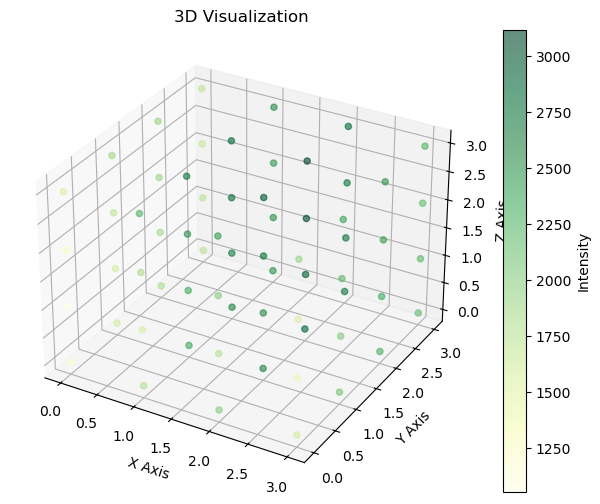


Applying Filter 7/32:
Activation map shape: torch.Size([4, 4, 4])


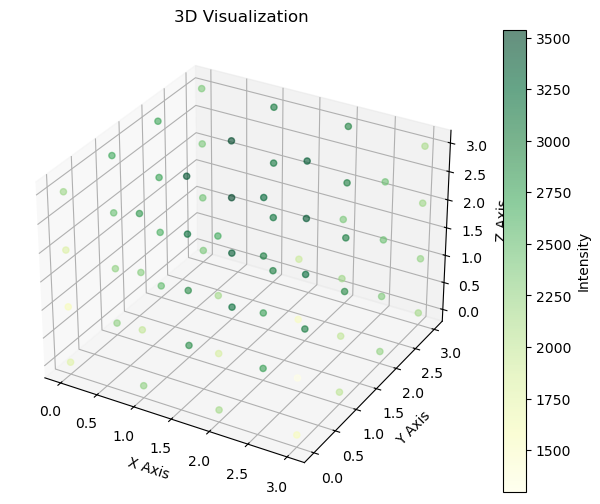


Applying Filter 8/32:
Activation map shape: torch.Size([4, 4, 4])


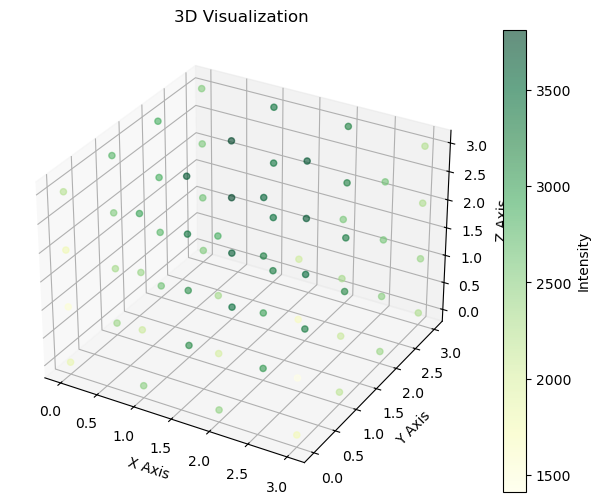


Applying Filter 9/32:
Activation map shape: torch.Size([4, 4, 4])


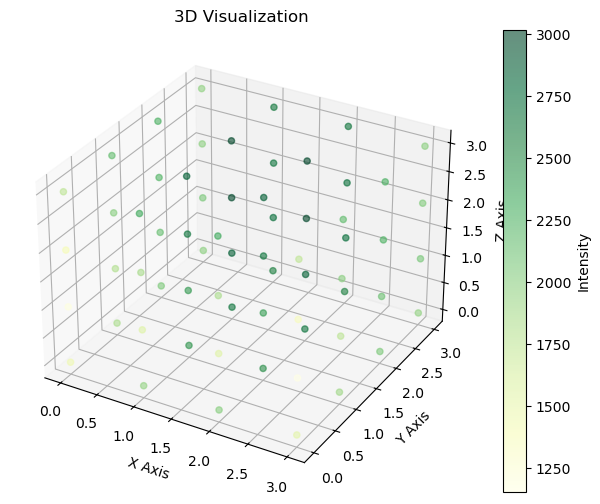


Applying Filter 10/32:
Activation map shape: torch.Size([4, 4, 4])


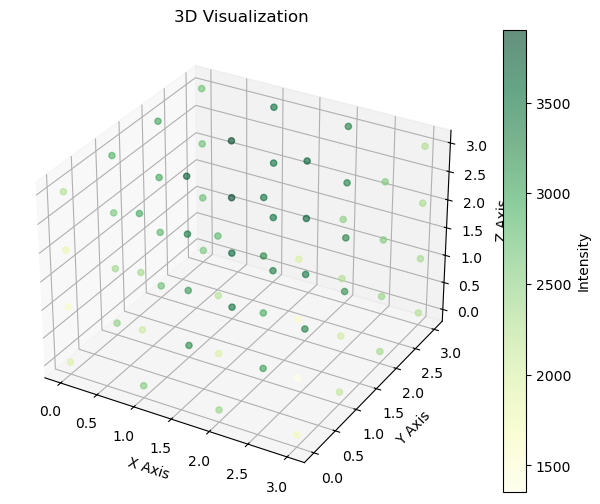


Applying Filter 11/32:
Activation map shape: torch.Size([4, 4, 4])


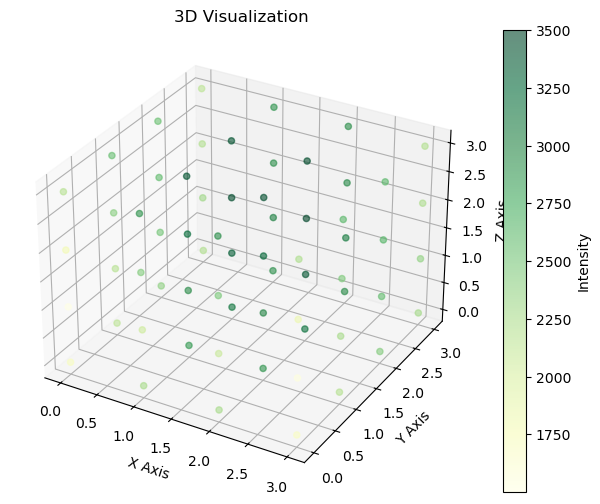


Applying Filter 12/32:
Activation map shape: torch.Size([4, 4, 4])


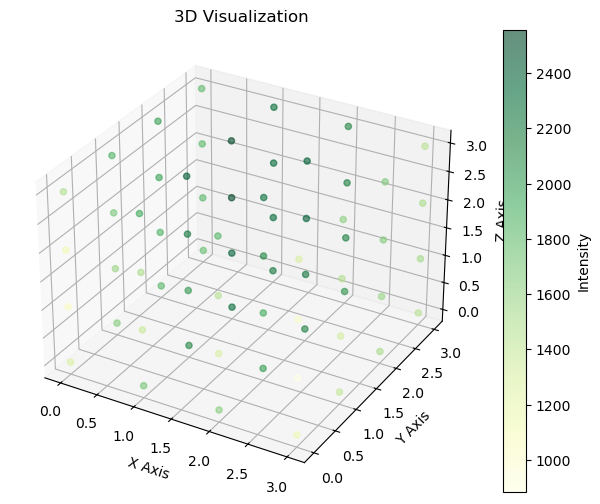


Applying Filter 13/32:
Activation map shape: torch.Size([4, 4, 4])


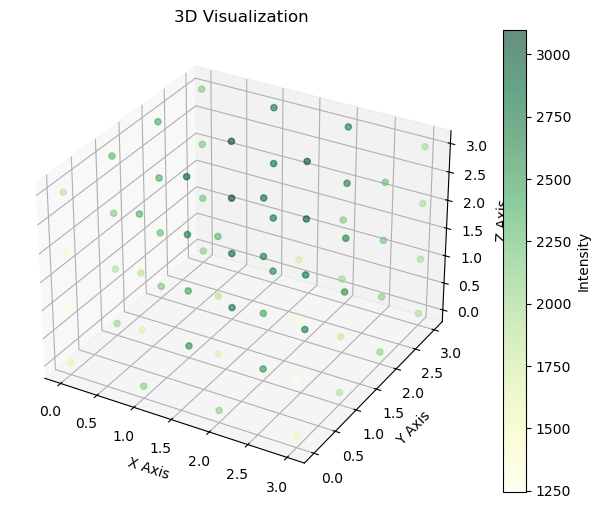


Applying Filter 14/32:
Activation map shape: torch.Size([4, 4, 4])


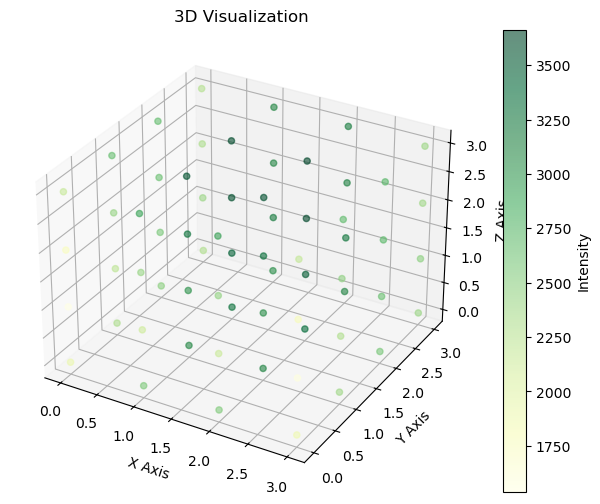


Applying Filter 15/32:
Activation map shape: torch.Size([4, 4, 4])


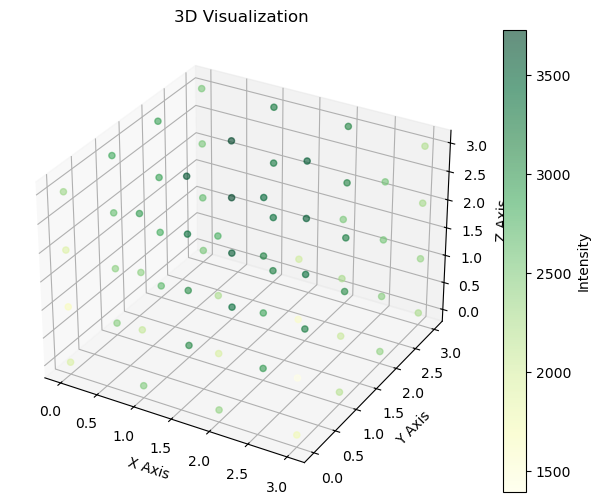


Applying Filter 16/32:
Activation map shape: torch.Size([4, 4, 4])


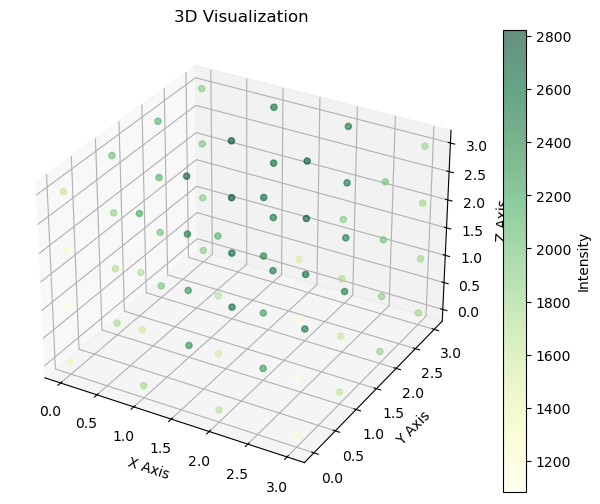


Applying Filter 17/32:
Activation map shape: torch.Size([4, 4, 4])


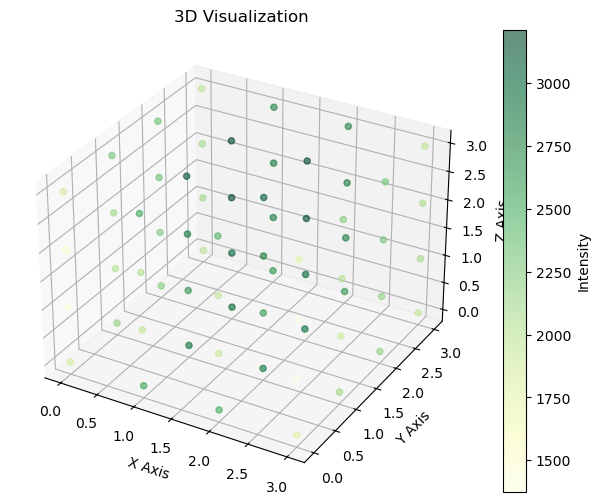


Applying Filter 18/32:
Activation map shape: torch.Size([4, 4, 4])


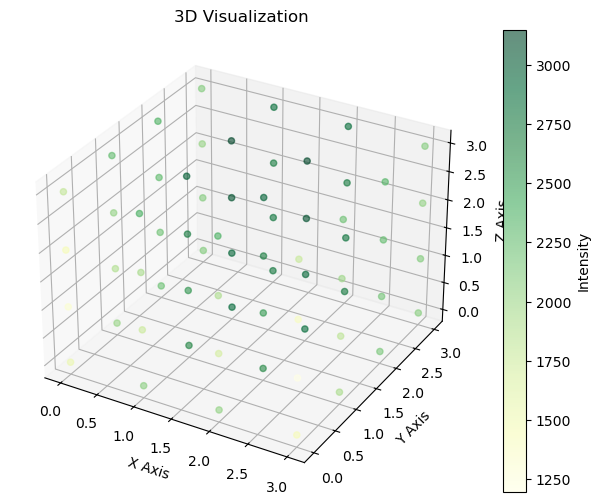


Applying Filter 19/32:
Activation map shape: torch.Size([4, 4, 4])


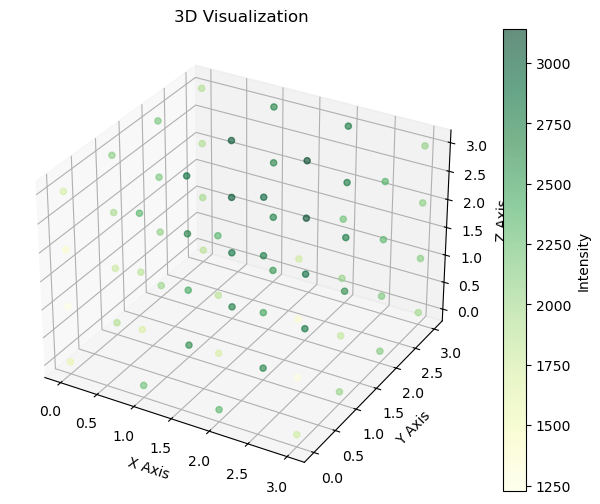


Applying Filter 20/32:
Activation map shape: torch.Size([4, 4, 4])


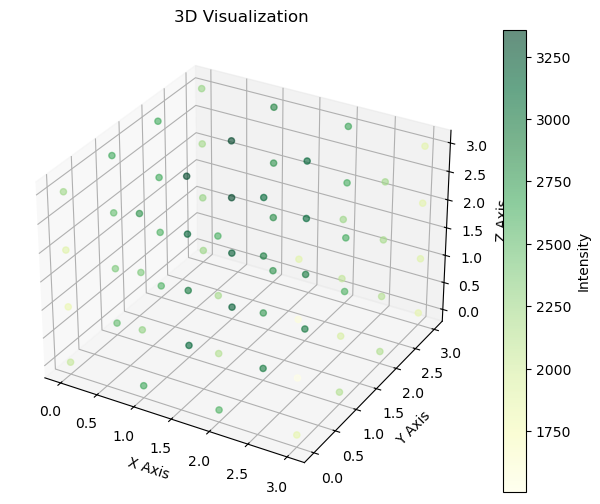


Applying Filter 21/32:
Activation map shape: torch.Size([4, 4, 4])


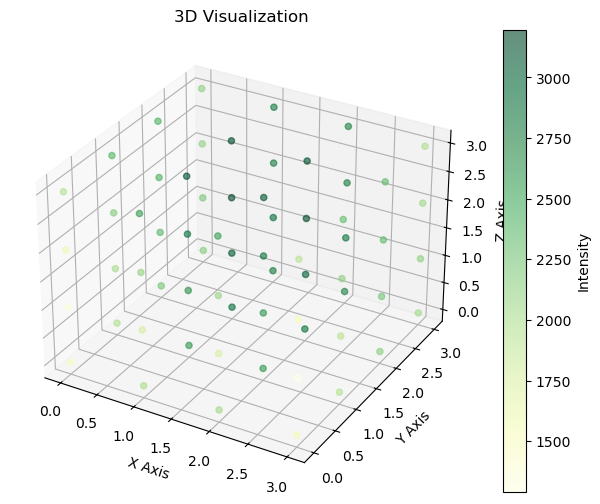


Applying Filter 22/32:
Activation map shape: torch.Size([4, 4, 4])


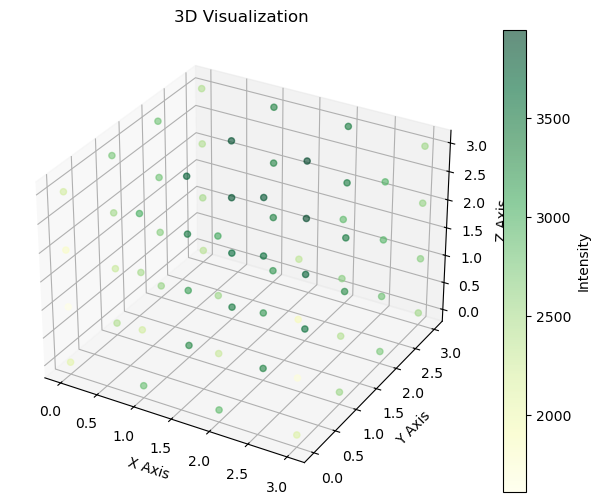


Applying Filter 23/32:
Activation map shape: torch.Size([4, 4, 4])


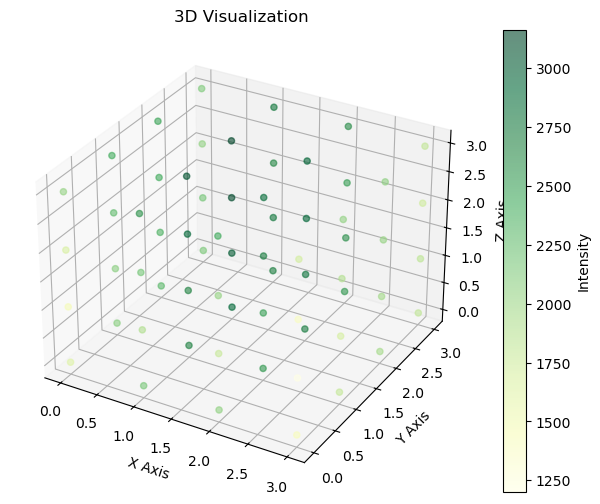


Applying Filter 24/32:
Activation map shape: torch.Size([4, 4, 4])


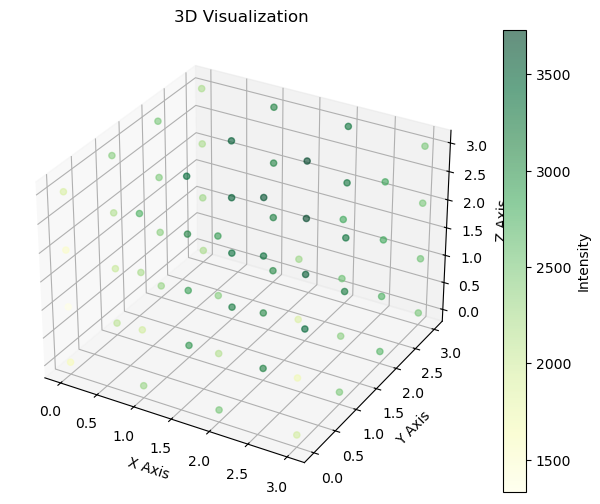


Applying Filter 25/32:
Activation map shape: torch.Size([4, 4, 4])


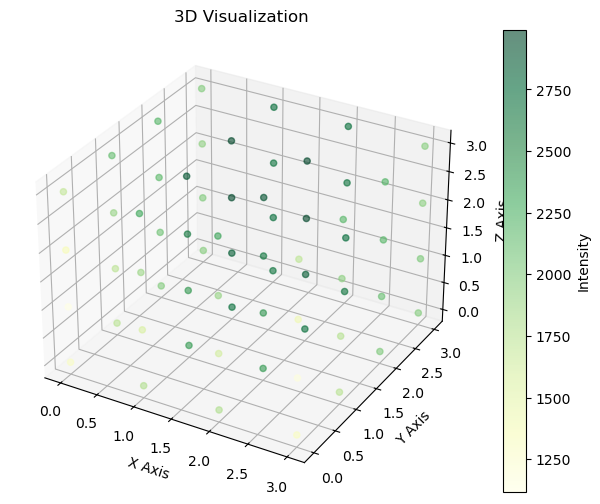


Applying Filter 26/32:
Activation map shape: torch.Size([4, 4, 4])


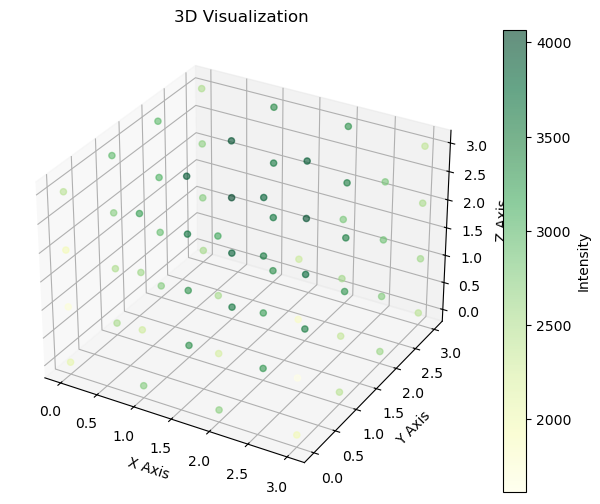


Applying Filter 27/32:
Activation map shape: torch.Size([4, 4, 4])


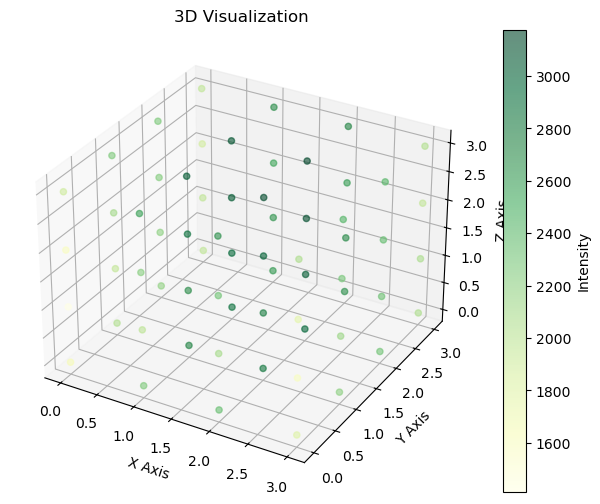


Applying Filter 28/32:
Activation map shape: torch.Size([4, 4, 4])


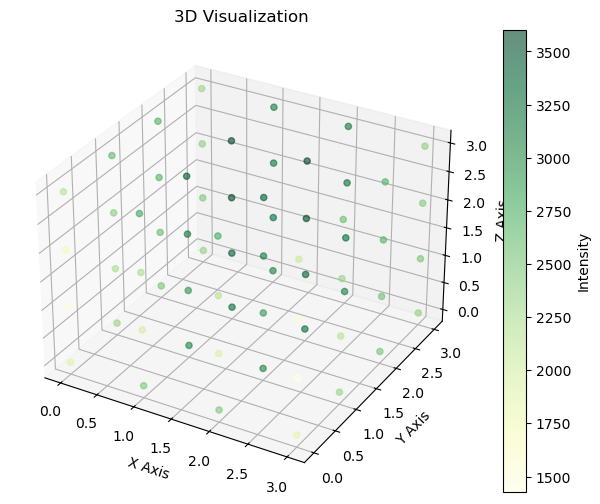


Applying Filter 29/32:
Activation map shape: torch.Size([4, 4, 4])


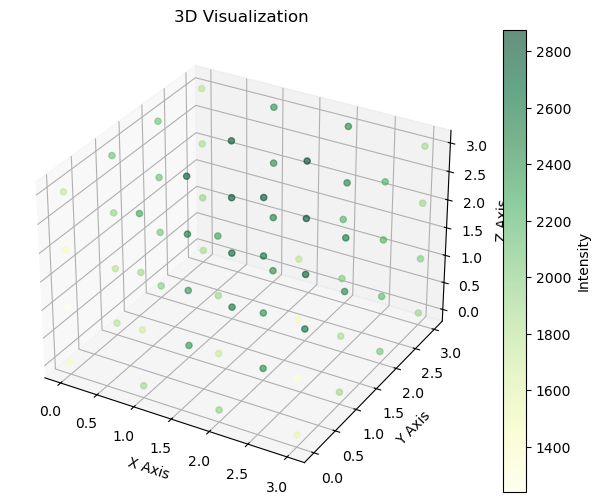


Applying Filter 30/32:
Activation map shape: torch.Size([4, 4, 4])


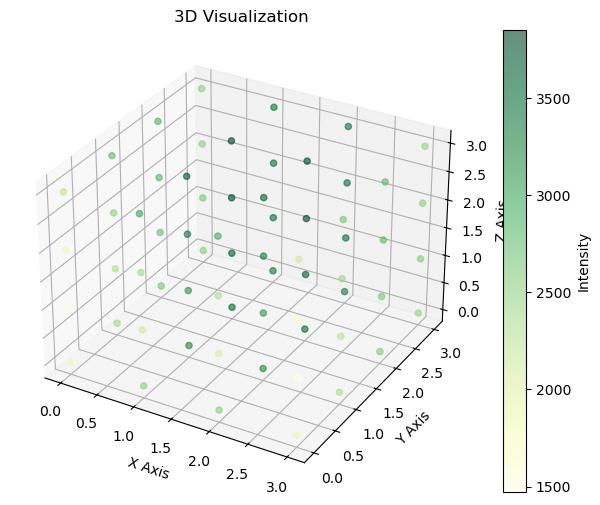


Applying Filter 31/32:
Activation map shape: torch.Size([4, 4, 4])


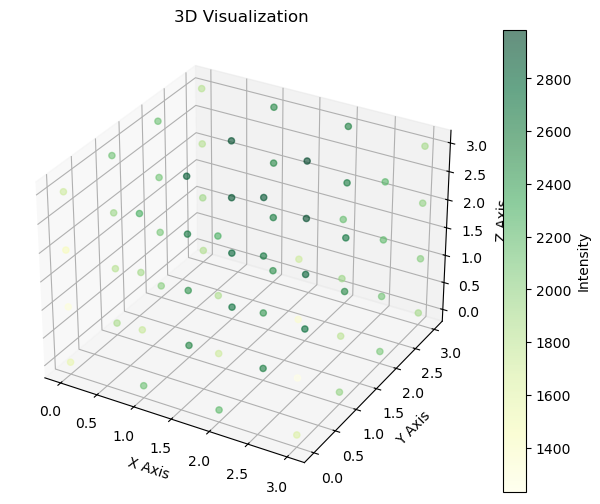


Applying Filter 32/32:
Activation map shape: torch.Size([4, 4, 4])


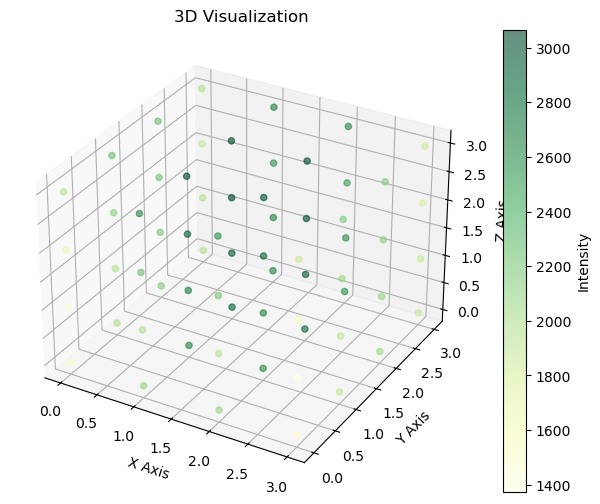

Output Tensor Shape (Activation Volume): torch.Size([32, 4, 4, 4])
Pooled Output Shape: torch.Size([32, 2, 2, 2])
Global Average Pooled Shape: torch.Size([32, 1, 1, 1])


In [47]:
model = CNN3DModel()
output = model.forward(x1)

In [49]:
output

tensor([[9.3497e-01, 3.6114e-09, 2.3708e-09, 3.6819e-12, 9.7445e-05, 2.1655e-12,
         1.8780e-10, 6.4909e-02, 1.1714e-05, 1.3880e-05]],
       grad_fn=<DivBackward0>)

# Sequence Models: Counting Parantheses Counting problem


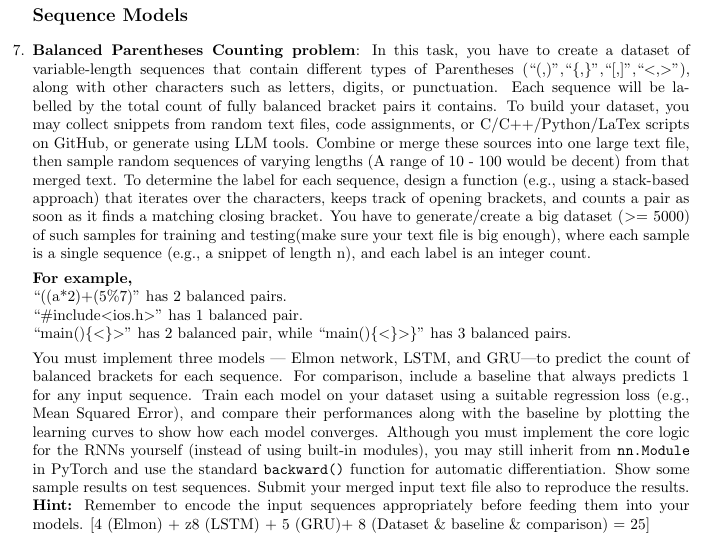


In [14]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn

### Function for counting the number of balanced parentheses


In [17]:
opening = ["(","[","{","<"]
closing = [")","]","}",">"]
openCount = {
    "(":0,
    "[":0,
    "{":0,
    "<":0 
}

def count_parentheses_pairs(seq):
    label = 0
    for char in seq:
        if(char in opening):
            openCount[char]+=1
        elif(char in closing):
            i = closing.index(char)
            if(openCount[opening[i]]>0):
                label+=1
                openCount[opening[i]]-=1
    return label    

### Dataset Creation: Training,Testing & Merged Text file of sequences


In [ ]:
# Dataset creation 
import random
import string
import os
import json
from collections import Counter

def generate_raw_text():
    """Generate a large text file with sequences containing various parentheses and characters."""
    
    parentheses = ['(', ')', '{', '}', '[', ']', '<', '>']
    chars = list(string.ascii_letters + string.digits + string.punctuation)
    chars = [c for c in chars if c not in parentheses and c != '.']  # Remove parentheses and dots
    
    sequences = []
    for _ in range(10000):
        seq_length = random.randint(5, 50)
        sequence = []
        
        for _ in range(seq_length):
            char_type = random.choices(['parenthesis', 'other'], weights=[0.3, 0.7])[0]
            
            if char_type == 'parenthesis':
                # 70% chance to add opening bracket, 30% chance to add closing bracket
                paren_type = random.randint(0, 3)  # 0: (), 1: {}, 2: [], 3: <>
                is_opening = random.choices([True, False], weights=[0.7, 0.3])[0]
                if is_opening:
                    sequence.append(['(', '{', '[', '<'][paren_type])
                else:
                    sequence.append([')', '}', ']', '>'][paren_type])
            else:
                sequence.append(random.choice(chars))
        
        sequences.append(''.join(sequence) + '.')
    
    return ' '.join(sequences)

def write_raw_text_to_file(text, filename="raw_text.txt"):
    """Write the generated text to a file."""
    with open(filename, 'w', encoding='utf-8') as f:
        f.write(text)
    return filename

def sample_sequences_from_file(filename, num_samples=5000, min_len=10, max_len=100):
    """Sample random sequences from the raw text file."""
    with open(filename, 'r', encoding='utf-8') as f:
        text = f.read()
    
    sequences = text.split('. ')
    sequences = [seq.strip() + '.' if not seq.endswith('.') else seq.strip() for seq in sequences]
    sequences = [seq for seq in sequences if seq != '.']
    
    # Sample random sequences
    if len(sequences) < num_samples:
        # If we don't have enough sequences, sample with replacement
        sampled_sequences = random.choices(sequences, k=num_samples)
    else:
        # Otherwise, sample without replacement
        sampled_sequences = random.sample(sequences, num_samples)
    
    # Ensure sampled sequences are within the length range
    final_sequences = []
    for seq in sampled_sequences:
        if min_len <= len(seq) <= max_len:
            final_sequences.append(seq)
        else:
            # Generate a new sequence if the sampled one is outside the range
            new_length = random.randint(min_len, max_len)
            if len(seq) > new_length:
                # Truncate the sequence and add a dot
                final_sequences.append(seq[:new_length-1] + '.')
            else:
                # Generate a completely new sequence
                new_seq = generate_sequence(new_length)
                final_sequences.append(new_seq)
    
    return final_sequences

def generate_sequence(length):
    """Generate a single random sequence of specified length."""
    parentheses = ['(', ')', '{', '}', '[', ']', '<', '>']
    chars = list(string.ascii_letters + string.digits + string.punctuation)
    chars = [c for c in chars if c not in parentheses and c != '.']
    
    sequence = []
    for i in range(length-1):  # -1 to leave room for the dot
        char_type = random.choices(['parenthesis', 'other'], weights=[0.3, 0.7])[0]
        
        if char_type == 'parenthesis':
            paren_type = random.randint(0, 3)
            is_opening = random.choices([True, False], weights=[0.7, 0.3])[0]
            if is_opening:
                sequence.append(['(', '{', '[', '<'][paren_type])
            else:
                sequence.append([')', '}', ']', '>'][paren_type])
        else:
            sequence.append(random.choice(chars))
    
    return ''.join(sequence) + '.'

def create_dataset(sequences):
    """Create a dataset with sequences and their parentheses pair counts."""
    dataset = []
    for seq in sequences:
        count = count_parentheses_pairs(seq)
        dataset.append({"sequence": seq, "count": count})
    return dataset

def split_dataset(dataset, train_ratio=0.8):
    """Split the dataset into training and testing sets."""
    random.shuffle(dataset)
    split_idx = int(len(dataset) * train_ratio)
    train_data = dataset[:split_idx]
    test_data = dataset[split_idx:]
    return train_data, test_data

def save_dataset(train_data, test_data, train_file="train_dataset.json", test_file="test_dataset.json"):
    """Save the training and testing datasets to JSON files."""
    with open(train_file, 'w', encoding='utf-8') as f:
        json.dump(train_data, f, indent=2)
    
    with open(test_file, 'w', encoding='utf-8') as f:
        json.dump(test_data, f, indent=2)
    
    return train_file, test_file

def dataset_stats(dataset):
    """Calculate and return statistics about the dataset."""
    counts = [item['count'] for item in dataset]
    lengths = [len(item['sequence']) for item in dataset]
    
    stats = {
        "total_samples": len(dataset),
        "count_distribution": dict(Counter(counts)),
        "avg_sequence_length": sum(lengths) / len(lengths),
        "min_sequence_length": min(lengths),
        "max_sequence_length": max(lengths),
        "avg_pair_count": sum(counts) / len(counts),
        "max_pair_count": max(counts),
        "min_pair_count": min(counts)
    }
    
    return stats

def main():
    # Generate raw text
    print("Generating raw text...")
    raw_text = generate_raw_text()
    
    # Write raw text to file
    filename = write_raw_text_to_file(raw_text)
    print(f"Raw text written to {filename}")
    
    # Sample sequences
    print("Sampling sequences...")
    sequences = sample_sequences_from_file(filename, num_samples=6000, min_len=10, max_len=100)
    print(f"Sampled {len(sequences)} sequences")
    
    # Create dataset
    print("Creating dataset...")
    dataset = create_dataset(sequences)
    
    # Split dataset
    print("Splitting dataset...")
    train_data, test_data = split_dataset(dataset)
    print(f"Training samples: {len(train_data)}, Testing samples: {len(test_data)}")
    
    # Save dataset
    print("Saving dataset...")
    train_file, test_file = save_dataset(train_data, test_data)
    print(f"Training data saved to {train_file}")
    print(f"Testing data saved to {test_file}")
    
    # Print dataset statistics
    print("\nDataset Statistics:")
    train_stats = dataset_stats(train_data)
    test_stats = dataset_stats(test_data)
    
    print("\nTraining Dataset:")
    for key, value in train_stats.items():
        if key != "count_distribution":
            print(f"  {key}: {value}")
    print("  Count distribution:")
    for count, freq in sorted(train_stats["count_distribution"].items()):
        print(f"    {count} pairs: {freq} samples ({freq/len(train_data)*100:.2f}%)")
    
    print("\nTesting Dataset:")
    for key, value in test_stats.items():
        if key != "count_distribution":
            print(f"  {key}: {value}")
    print("  Count distribution:")
    for count, freq in sorted(test_stats["count_distribution"].items()):
        print(f"    {count} pairs: {freq} samples ({freq/len(test_data)*100:.2f}%)")
    
    print("\nSample sequences with counts:")
    for i, item in enumerate(random.sample(dataset, 10)):
        print(f"  {i+1}. Sequence: {item['sequence']}")
        print(f"     Count: {item['count']}")
        print()

if __name__ == "__main__":
    main()

### Encoder


In [19]:
import numpy as np
import string

# Character to index mapping
char_to_idx = {'(': 7, ')': 8, '{': 9, '}': 10, '[': 11, ']': 12, '<': 13, '>': 14}

# Letters (both uppercase and lowercase) to index 1
for char in string.ascii_letters:
    char_to_idx[char] = 1

# Digits to index 2
for char in string.digits:
    char_to_idx[char] = 2

# Punctuation except brackets to index 3
for char in string.punctuation:
    if char not in ['(', ')', '{', '}', '<', '>', '[', ']']:
        char_to_idx[char] = 3

# Space and special whitespace characters
char_to_idx[' '] = 4
char_to_idx['\t'] = 5
char_to_idx['\n'] = 6

# Default index for unknown characters
UNKNOWN_IDX = 15

def embedding(seq: str) -> np.ndarray:
    """Returns a (17, min(seq_length, 100)) one-hot encoded numpy array for the sequence."""
    seq_length = min(len(seq), 100)  # Max of 100 sequence characters
    embed = np.zeros((17, seq_length))

    for i in range(seq_length):
        idx = char_to_idx.get(seq[i], UNKNOWN_IDX)  # Default to UNKNOWN_IDX if not found
        if idx < 17:  # Ensure the index is within bounds
            embed[idx, i] = 1

    return embed

In [21]:
embedding("`nhz\D*<i=)]D#<q<{<!2f[f#<u)_Syn[[.").shape

<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
C:\Users\abhin\AppData\Local\Temp\ipykernel_18856\1644869032.py:1: SyntaxWarning: invalid escape sequence '\D'
  embedding("`nhz\D*<i=)]D#<q<{<!2f[f#<u)_Syn[[.").shape


(17, 35)

### Elmon


In [29]:
# Gating function using sigmoid
def Gating(x: np.ndarray):
    return 1 / (1 + np.exp(-x))

# Activation function (supports 'tanh' and 'relu')
def Activation(x: np.ndarray, activation: str = 'tanh'):
    if activation == 'tanh':
        return np.tanh(x)
    elif activation == 'relu':
        return np.maximum(0, x)
    else:
        raise ValueError('Unsupported activation function')

# Elmon Network
class Elmon:
    def __init__(self, nH, nI, activation='tanh'):
        self.nH = nH
        self.nI = nI
        self.activation = activation
        
        # Initialize weights and biases
        self.Wx = np.random.randn(nH, nI) * 0.01
        self.Wh = np.random.randn(nH, nH) * 0.01
        self.bx = np.zeros((nH, 1))
        
        self.Wy = np.random.randn(1, nH) * 0.01
        self.by = np.zeros((1, 1))

    # Feedforward pass
    def feedForward(self, embed: np.ndarray):
        h_t = np.zeros((self.nH, 1))
        embed = embed.T
        
        for t in range(embed.shape[0]):
            x_t = embed[t].reshape((self.nI, 1))
            z_t = Gating(self.Wx @ x_t + self.Wh @ h_t + self.bx)
            h_t = (z_t * Activation(self.Wx @ x_t, self.activation) +
                   (1 - z_t) * Activation(h_t, self.activation))
        
        y_t = self.Wy @ h_t + self.by
        return y_t.flatten()

    # Backpropagation
    def backprop(self, embed: np.ndarray, target: float, lr: float = 0.001):
        h_t = np.zeros((self.nH, 1))
        embed = embed.T
        hs, zs, xs = [], [], []
        
        for t in range(embed.shape[0]):
            x_t = embed[t].reshape((self.nI, 1))
            z_t = Gating(self.Wx @ x_t + self.Wh @ h_t + self.bx)
            h_t = (z_t * Activation(self.Wx @ x_t, self.activation) +
                   (1 - z_t) * Activation(h_t, self.activation))
            hs.append(h_t)
            zs.append(z_t)
            xs.append(x_t)
        
        y_pred = self.Wy @ h_t + self.by
        loss = 0.5 * (y_pred - target) ** 2
        dy = y_pred - target
        
        # Gradients for output layer
        dWy = dy @ hs[-1].T
        dby = dy
        
        # Initialize gradients for hidden layers
        dWx = np.zeros_like(self.Wx)
        dWh = np.zeros_like(self.Wh)
        dbx = np.zeros_like(self.bx)
        dh_next = np.zeros_like(h_t)
        
        for t in reversed(range(len(xs))):
            dz = dh_next * (hs[t] - Activation(xs[t], self.activation))
            dWx += dz @ xs[t].T
            dWh += dz @ hs[t-1].T if t > 0 else dz @ np.zeros_like(h_t).T
            dbx += dz
            dh_next = (1 - zs[t]) * dh_next
        
        # Update weights and biases
        self.Wy -= lr * dWy
        self.by -= lr * dby
        self.Wx -= lr * dWx
        self.Wh -= lr * dWh
        self.bx -= lr * dbx

        return loss.flatten()[0]

In [31]:
elmon = Elmon(nH=32, nI=17, activation='tanh')  # nI is 17 to match the embedding size
elmon.feedForward(embedding("`nhz\D*<i=)]D#<q<{<!2f[f#<u)_Syn[[."))

<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
C:\Users\abhin\AppData\Local\Temp\ipykernel_18856\861178900.py:2: SyntaxWarning: invalid escape sequence '\D'
  ElmonRNN.feedForward(embedding("`nhz\D*<i=)]D#<q<{<!2f[f#<u)_Syn[[."))


array([-0.00012136])

### Model Trainer


In [130]:
import numpy as np
import json
import matplotlib.pyplot as plt
from tqdm import tqdm

# Load dataset
def load_dataset(train_file="train_dataset.json", test_file="test_dataset.json"):
    with open(train_file, 'r', encoding='utf-8') as f:
        train_data = json.load(f)
    with open(test_file, 'r', encoding='utf-8') as f:
        test_data = json.load(f)
    return train_data, test_data


class ModelTrainer:
    def __init__(self, model, lr=0.01, epochs=50):
        self.model = model
        self.lr = lr
        self.epochs = epochs
        self.loss_history = {'train': [], 'test': []}

    def train(self, train_data, test_data=None):
        for epoch in range(self.epochs):
            epoch_train_loss = 0.0
            for sample in tqdm(train_data, desc=f'Epoch {epoch+1}/{self.epochs}'):
                sequence = sample['sequence']
                target = sample['count']
                x = embedding(sequence)
                y_pred = self.model.feedForward(x)
                loss = (y_pred - target) ** 2
                epoch_train_loss += loss

                # Backpropagation
                dL_dy = 2 * (y_pred - target)
                self.model.Wy -= self.lr * dL_dy * self.model.Wy
                self.model.by -= self.lr * dL_dy

            epoch_train_loss /= len(train_data)
            self.loss_history['train'].append(epoch_train_loss)

            # Calculate test loss if test data is provided
            if test_data:
                epoch_test_loss = 0.0
                for sample in test_data:
                    sequence = sample['sequence']
                    target = sample['count']
                    x = embedding(sequence)
                    y_pred = self.model.feedForward(x)
                    loss = (y_pred - target) ** 2
                    epoch_test_loss += loss

                epoch_test_loss /= len(test_data)
                self.loss_history['test'].append(epoch_test_loss)

            print(f'Epoch {epoch+1}, Train Loss: {epoch_train_loss.item():.4f}, Test Loss: {epoch_test_loss.item():.4f}' if test_data else f'Epoch {epoch+1}, Train Loss: {epoch_train_loss.item():.4f}')

### LSTM


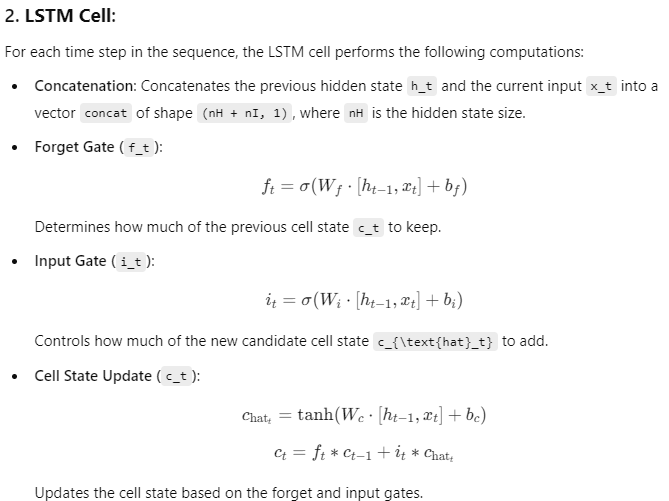
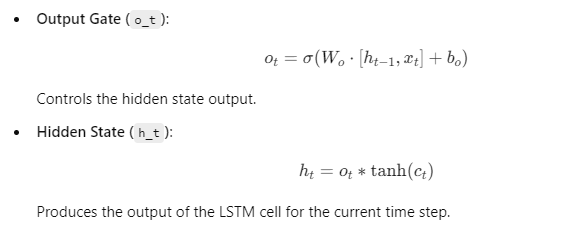


In [86]:
import numpy as np
import matplotlib.pyplot as plt

class LSTM:
    def __init__(self, nH, nI, activation='tanh'):
        self.nH = nH  # Hidden state size
        self.nI = nI  # Input size
        self.activation = activation
        self.initialize_weights()

    def initialize_weights(self):
        # Initialize weights for input and hidden states
        self.Wf = np.random.randn(self.nH, self.nH + self.nI) * 0.01  # Forget gate
        self.Wi = np.random.randn(self.nH, self.nH + self.nI) * 0.01  # Input gate
        self.Wo = np.random.randn(self.nH, self.nH + self.nI) * 0.01  # Output gate
        self.Wc = np.random.randn(self.nH, self.nH + self.nI) * 0.01  # Cell state
        
        # Biases
        self.bf = np.zeros((self.nH, 1))
        self.bi = np.zeros((self.nH, 1))
        self.bo = np.zeros((self.nH, 1))
        self.bc = np.zeros((self.nH, 1))

        # Output layer
        self.Wy = np.random.randn(1, self.nH) * 0.01
        self.by = np.zeros((1, 1))

    def sigmoid(self, x):
        return 1 / (1 + np.exp(-x))

    def tanh(self, x):
        return np.tanh(x)

    def feedForward(self, embed) -> np.ndarray:
        h_t = np.zeros((self.nH, 1))
        c_t = np.zeros((self.nH, 1))
        embed = embed.T

        for t in range(embed.shape[0]):
            x_t = embed[t].reshape((self.nI, 1))
            concat = np.vstack((h_t, x_t))

            # Gates
            f_t = self.sigmoid(self.Wf @ concat + self.bf)  # Forget gate
            i_t = self.sigmoid(self.Wi @ concat + self.bi)  # Input gate
            o_t = self.sigmoid(self.Wo @ concat + self.bo)  # Output gate
            c_hat_t = self.tanh(self.Wc @ concat + self.bc)  # Cell candidate

            # Cell state and hidden state update
            c_t = f_t * c_t + i_t * c_hat_t
            h_t = o_t * self.tanh(c_t)

        # Output layer
        y_t = self.Wy @ h_t + self.by
        return y_t.flatten()

    def backprop(self, embed, target, lr=0.01):
        y_pred = self.feedForward(embed)
        loss = (y_pred - target) ** 2
        dL_dy = 2 * (y_pred - target)

        # Gradient descent for output layer
        self.Wy -= lr * dL_dy * embed.T
        self.by -= lr * dL_dy

        return loss

### GRU


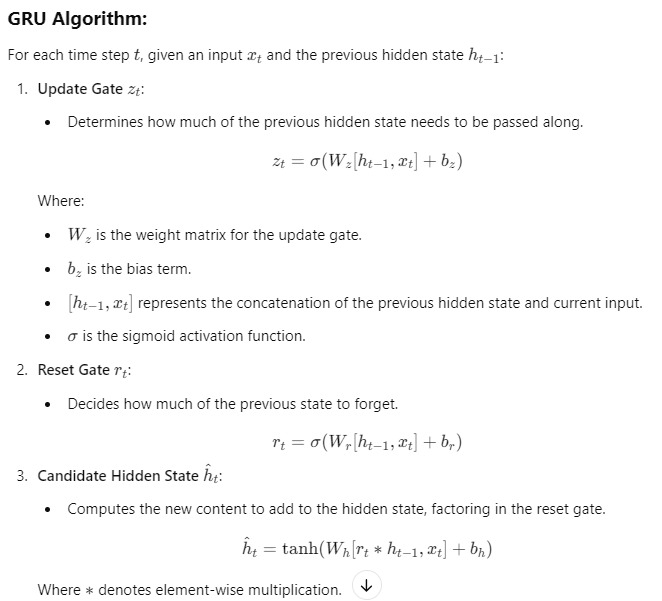
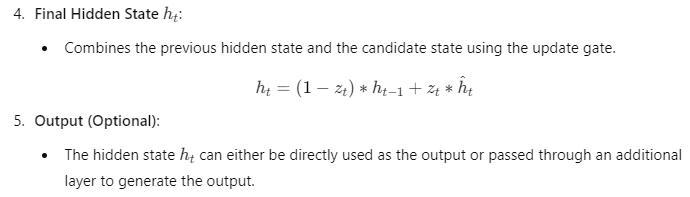


In [96]:
class GRU:
    def __init__(self, nH, nI, activation='tanh'):
        self.nH = nH  # Hidden state size
        self.nI = nI  # Input size
        self.activation = activation
        self.initialize_weights()

    def initialize_weights(self):
        # Initialize weights for GRU gates
        self.Wz = np.random.randn(self.nH, self.nH + self.nI) * 0.01  # Update gate
        self.Wr = np.random.randn(self.nH, self.nH + self.nI) * 0.01  # Reset gate
        self.Wh = np.random.randn(self.nH, self.nH + self.nI) * 0.01  # Candidate hidden state

        # Biases
        self.bz = np.zeros((self.nH, 1))
        self.br = np.zeros((self.nH, 1))
        self.bh = np.zeros((self.nH, 1))

        # Output layer
        self.Wy = np.random.randn(1, self.nH) * 0.01
        self.by = np.zeros((1, 1))

    def sigmoid(self, x):
        return 1 / (1 + np.exp(-x))

    def tanh(self, x):
        return np.tanh(x)

    def feedForward(self, embed) -> np.ndarray:
        h_t = np.zeros((self.nH, 1))
        embed = embed.T

        for t in range(embed.shape[0]):
            x_t = embed[t].reshape((self.nI, 1))
            concat = np.vstack((h_t, x_t))

            # GRU Gates
            z_t = self.sigmoid(self.Wz @ concat + self.bz)  # Update gate
            r_t = self.sigmoid(self.Wr @ concat + self.br)  # Reset gate

            # Candidate hidden state
            concat_reset = np.vstack((r_t * h_t, x_t))
            h_hat_t = self.tanh(self.Wh @ concat_reset + self.bh)

            # Hidden state update
            h_t = (1 - z_t) * h_t + z_t * h_hat_t

        # Output layer
        y_t = self.Wy @ h_t + self.by
        return y_t.flatten()

### Baseline Model


Baseline Model Loss: 7.8906


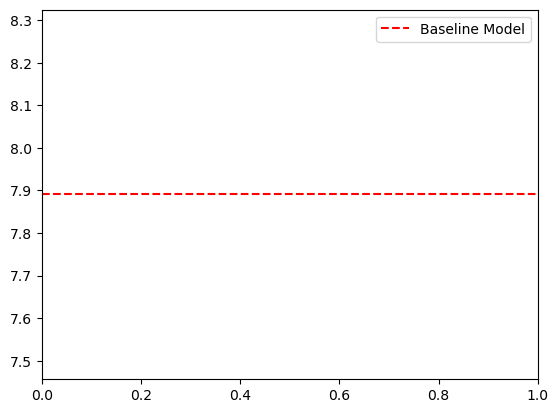

In [121]:
class BaselineModel:
    def predict(self, _):
        return 1.0  # Always predicts 1

    def evaluate(self, data):
        losses = [(1.0 - sample['count']) ** 2 for sample in data]
        mse = np.mean(losses)
        print(f'Baseline Model Loss: {mse:.4f}')
        return mse

# Baseline
baseline = BaselineModel()
baseline_loss = baseline.evaluate(train_data)

plt.axhline(y=baseline_loss, color='r', linestyle='--', label='Baseline Model')
plt.legend()
plt.show()

### Comparing the models losses


Epoch 1/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:22<00:00, 212.47it/s]


Epoch 1, Train Loss: 4.6010, Test Loss: 4.6526


Epoch 2/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:29<00:00, 161.46it/s]


Epoch 2, Train Loss: 4.5531, Test Loss: 4.6526


Epoch 3/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:31<00:00, 154.36it/s]


Epoch 3, Train Loss: 4.5531, Test Loss: 4.6526


Epoch 4/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:30<00:00, 157.31it/s]


Epoch 4, Train Loss: 4.5531, Test Loss: 4.6526


Epoch 5/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:30<00:00, 158.10it/s]


Epoch 5, Train Loss: 4.5531, Test Loss: 4.6526


Epoch 1/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:34<00:00, 138.82it/s]


Epoch 1, Train Loss: 4.6008, Test Loss: 4.6526


Epoch 2/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:34<00:00, 140.00it/s]


Epoch 2, Train Loss: 4.5531, Test Loss: 4.6526


Epoch 3/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:34<00:00, 139.27it/s]


Epoch 3, Train Loss: 4.5531, Test Loss: 4.6526


Epoch 4/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:34<00:00, 139.63it/s]


Epoch 4, Train Loss: 4.5531, Test Loss: 4.6526


Epoch 5/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:33<00:00, 144.61it/s]


Epoch 5, Train Loss: 4.5531, Test Loss: 4.6526


Epoch 1/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:18<00:00, 264.45it/s]


Epoch 1, Train Loss: 4.6011, Test Loss: 4.6526


Epoch 2/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:18<00:00, 262.15it/s]


Epoch 2, Train Loss: 4.5531, Test Loss: 4.6526


Epoch 3/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:17<00:00, 266.79it/s]


Epoch 3, Train Loss: 4.5531, Test Loss: 4.6526


Epoch 4/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:17<00:00, 268.31it/s]


Epoch 4, Train Loss: 4.5531, Test Loss: 4.6526


Epoch 5/5: 100%|██████████████████████████████████████████████████████████████████| 4800/4800 [00:17<00:00, 266.83it/s]


Epoch 5, Train Loss: 4.5531, Test Loss: 4.6526
Baseline Model Loss: 7.8906
Baseline Model Loss: 8.0783


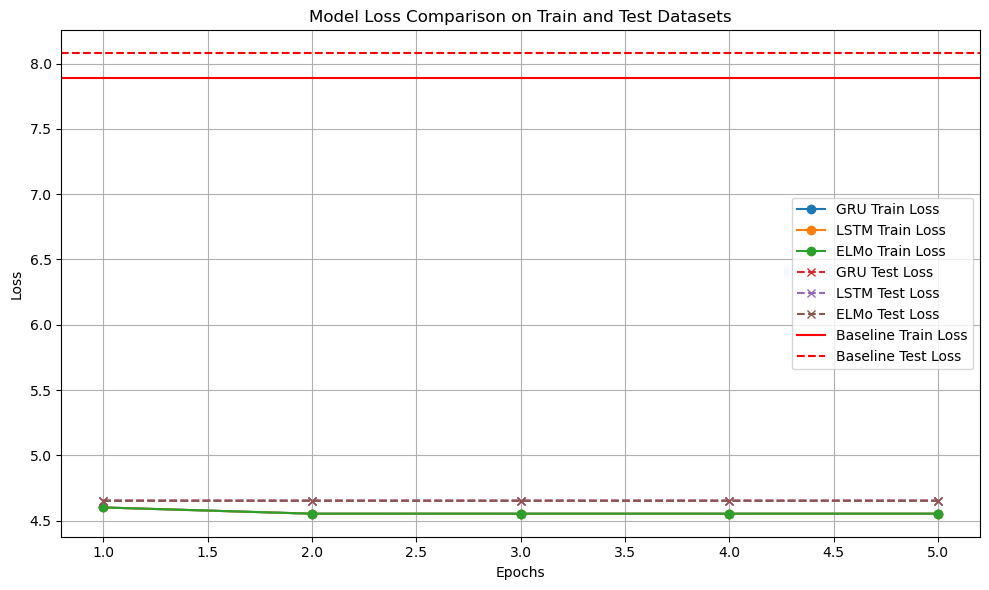

In [132]:
import matplotlib.pyplot as plt

# Load the dataset
train_data, test_data = load_dataset()

# Initialize and train the models
gru = GRU(nH=64, nI=17, activation='tanh')
lstm = LSTM(nH=64, nI=17, activation='tanh')
elmo = Elmon(nH=64, nI=17)

# Create model trainers
gru_trainer = ModelTrainer(gru, lr=0.01, epochs=5)
lstm_trainer = ModelTrainer(lstm, lr=0.01, epochs=5)
elmo_trainer = ModelTrainer(elmo, lr=0.01, epochs=5)

# Train all models
gru_trainer.train(train_data, test_data)
lstm_trainer.train(train_data, test_data)
elmo_trainer.train(train_data, test_data)

# Baseline model (no training needed)
baseline = BaselineModel()
baseline_train_loss = baseline.evaluate(train_data)
baseline_test_loss = baseline.evaluate(test_data)

# Extract loss data
epochs = range(1, len(gru_trainer.loss_history['train']) + 1)

# Plotting
plt.figure(figsize=(10, 6))

# Training losses
plt.plot(epochs, gru_trainer.loss_history['train'], label='GRU Train Loss', marker='o')
plt.plot(epochs, lstm_trainer.loss_history['train'], label='LSTM Train Loss', marker='o')
plt.plot(epochs, elmo_trainer.loss_history['train'], label='ELMo Train Loss', marker='o')

# Testing losses
plt.plot(epochs, gru_trainer.loss_history['test'], label='GRU Test Loss', linestyle='--', marker='x')
plt.plot(epochs, lstm_trainer.loss_history['test'], label='LSTM Test Loss', linestyle='--', marker='x')
plt.plot(epochs, elmo_trainer.loss_history['test'], label='ELMo Test Loss', linestyle='--', marker='x')

# Baseline model losses (constant lines)
plt.axhline(y=baseline_train_loss, color='r', linestyle='-', label='Baseline Train Loss')
plt.axhline(y=baseline_test_loss, color='r', linestyle='--', label='Baseline Test Loss')

# Formatting the plot
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Model Loss Comparison on Train and Test Datasets')
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()